# Audio & Speech EDA
Portuguese presidential debate dataset — 28 debate videos, 2656 audio segments, 8 candidates.

**Main questions:**
1. What do the acoustic features look like globally?
2. Do speaker embeddings separate the 3 speakers in each debate?
3. Can we match those clusters back to named candidates across debates?
4. What does the cleanest debate (`Martins_vs_Gouveia_Melo_November_23`) reveal in detail?
5. What candidate-level acoustic patterns and transcript-level patterns emerge across the campaign?

**Notebook structure:**
- Part I — audio dataset loading and feature setup
- Part II — global acoustic feature EDA
- Part III — speaker separation from embeddings
- Part IV — cross-debate speaker labeling
- Part V — single-debate case study: Martins vs Gouveia Melo
- Part VI — across-candidate acoustic profiles
- Part VII — transcript EDA: quality, lexical patterns, and semantic structure

## Part I — Audio dataset loading and feature setup

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import cdist

sns.set_theme(style='whitegrid')
plt.rcParams['figure.figsize'] = (12, 5)

FEATURES_DIR = 'Project_Features'

In [3]:
# Load all audio pkl files and concatenate
audio_files = sorted([
    f for f in os.listdir(FEATURES_DIR)
    if f.endswith('_audio.pkl')
])

dfs = []
for f in audio_files:
    df = pd.read_pickle(os.path.join(FEATURES_DIR, f))
    df['video'] = f.replace('_audio.pkl', '')
    dfs.append(df)

data = pd.concat(dfs, ignore_index=True)
print(f'{len(data)} segments across {data["video"].nunique()} videos')
print(f'Columns: {list(data.columns)}')

2656 segments across 28 videos
Columns: ['time stamp', 'duration', 'meanF0Hz', 'stdevF0Hz', 'HNR', 'localJitter', 'localabsoluteJitter', 'rapJitter', 'ppq5Jitter', 'ddpJitter', 'localShimmer', 'localdbShimmer', 'apq3Shimmer', 'apq5Shimmer', 'apq11Shimmer', 'ddaShimmer', 'f1_mean', 'f2_mean', 'f3_mean', 'f4_mean', 'f1_median', 'f2_median', 'f3_median', 'f4_median', 'npause', 'speechrate', 'articulationrate', 'asd', 'speak_embeddings', 'pF', 'fdisp', 'avgFormant', 'mff', 'video']


In [4]:
# Parse speak_embeddings — stored as numpy arrays in pkl, but may be strings if loaded from CSV
def parse_embedding(s):
    if isinstance(s, np.ndarray):
        return s
    return np.fromstring(s.strip('[]'), sep=' ')

data['speak_embeddings'] = data['speak_embeddings'].apply(parse_embedding)

# Party mapping
data_parties = pd.read_pickle(os.path.join(FEATURES_DIR, 'candidate_party.pkl'))
candidate_to_party = dict(zip(data_parties['Candidate'], data_parties['Party']))
print('Party mapping:', candidate_to_party)

# Known candidates
CANDIDATES = [
    'Cotrim_Figueiredo', 'Filipe', 'Gouveia_Melo',
    'Marques_Mendes', 'Martins', 'Pinto', 'Seguro', 'Ventura'
]

def extract_candidates(video_name):
    """Returns (candidateA, candidateB) from debate video filename."""
    for c in CANDIDATES:
        if video_name.startswith(c):
            rest = video_name[len(c) + len('_vs_'):]
            for c2 in CANDIDATES:
                if rest.startswith(c2):
                    return c, c2
    return None, None

debate_videos = sorted([v for v in data['video'].unique() if 'vs' in v])
print(f'\nDebate videos: {len(debate_videos)}')
print(f'Non-debate videos (newscasts etc.): {data["video"].nunique() - len(debate_videos)}')

Party mapping: {'Gouveia_Melo': 'Independent', 'Marques_Mendes': 'PSD+CDS', 'Seguro': 'PS', 'Ventura': 'CH', 'Cotrim_Figueiredo': 'IL', 'Filipe': 'CDU', 'Martins': 'BE', 'Pinto': 'L'}

Debate videos: 28
Non-debate videos (newscasts etc.): 0


## Part II — Global acoustic feature overview

30 scalar features fall into 4 groups:
- **Pitch**: `meanF0Hz`, `stdevF0Hz`
- **Voice quality**: `HNR`, jitter family, shimmer family
- **Formants**: `f1_mean` through `f4_mean`, `fdisp`, `avgFormant`, `pF`, `mff`
- **Speech rate**: `speechrate`, `articulationrate`, `npause`, `asd`

We use a representative subset (`KEY_FEATURES`) for grouped plots. The next steps ask two simple EDA questions:
1. how are these features distributed overall?
2. which of them are redundant or strongly coupled?

In [5]:
META = ['video', 'time stamp', 'duration', 'speak_embeddings']
scalar_cols = [c for c in data.columns if c not in META]

KEY_FEATURES = [
    'meanF0Hz',         # pitch
    'stdevF0Hz',        # pitch variability
    'HNR',              # voice clarity
    'localJitter',      # pitch irregularity (one representative)
    'localShimmer',     # amplitude irregularity (one representative)
    'speechrate',       # syllables/sec including pauses
    'articulationrate', # syllables/sec excluding pauses
    'npause',           # number of pauses
    'asd',              # average syllable duration
    'f1_mean',          # first formant
    'f2_mean',          # second formant
    'fdisp',            # formant dispersion
]

print('Key features:', KEY_FEATURES)
print(f'Total scalar features: {len(scalar_cols)}')

Key features: ['meanF0Hz', 'stdevF0Hz', 'HNR', 'localJitter', 'localShimmer', 'speechrate', 'articulationrate', 'npause', 'asd', 'f1_mean', 'f2_mean', 'fdisp']
Total scalar features: 30


### 2.1 Distribution of core acoustic features

In [6]:
data[KEY_FEATURES].describe().T.round(3)

,count,mean,std,min,25%,50%,75%,max
meanF0Hz,2656.0,153.812,31.455,84.690,129.671,149.873,177.109,235.532
stdevF0Hz,2656.0,33.276,9.977,9.947,26.100,32.623,39.792,72.745
HNR,2656.0,10.508,1.855,2.452,9.353,10.529,11.745,16.450
localJitter,2656.0,0.028,0.005,0.014,0.026,0.029,0.032,0.045
localShimmer,2656.0,0.111,0.017,0.067,0.099,0.110,0.122,0.169
speechrate,2656.0,4.740,0.601,2.126,4.359,4.755,5.127,6.914
articulationrate,2656.0,5.014,0.501,3.025,4.697,5.027,5.349,6.914
npause,2656.0,2.595,3.488,0.000,0.000,1.000,3.000,44.000
asd,2656.0,0.202,0.021,0.145,0.187,0.199,0.213,0.331
f1_mean,2656.0,459.627,44.087,346.147,427.024,455.753,487.726,650.846


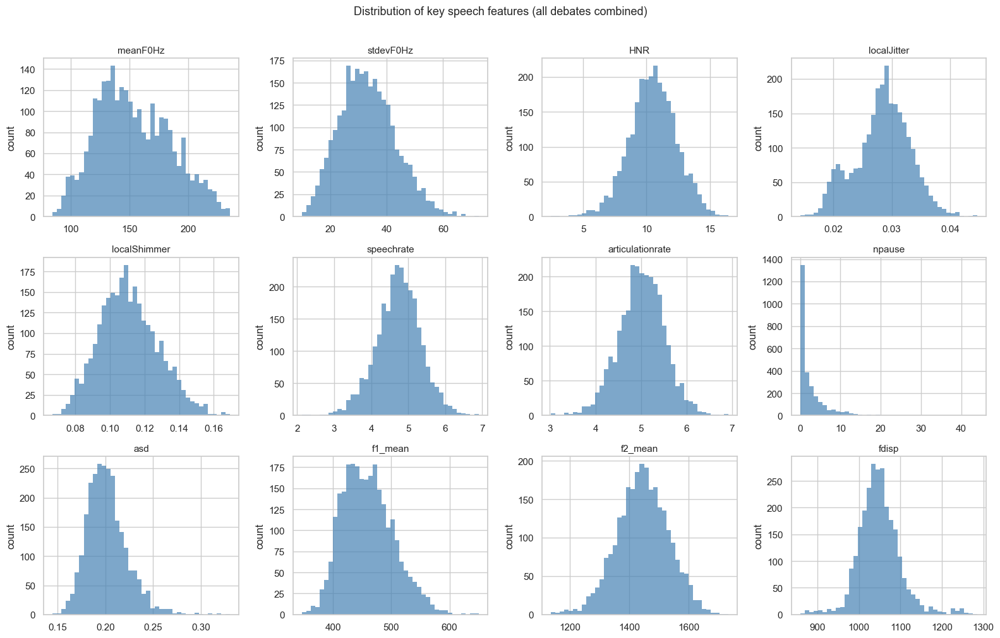

In [7]:
fig, axes = plt.subplots(3, 4, figsize=(16, 10))
axes = axes.flatten()

for i, col in enumerate(KEY_FEATURES):
    axes[i].hist(data[col].dropna(), bins=40, color='steelblue', alpha=0.7, edgecolor='none')
    axes[i].set_title(col, fontsize=11)
    axes[i].set_ylabel('count')

plt.suptitle('Distribution of key speech features (all debates combined)', fontsize=13, y=1.01)
plt.tight_layout()
plt.show()

### 2.2 Correlation structure and feature redundancy

Which features move together? Strong within-group correlations (jitter variants, formant variants) confirm redundancy.
Cross-group correlations (e.g. pitch vs. jitter) are more informative.

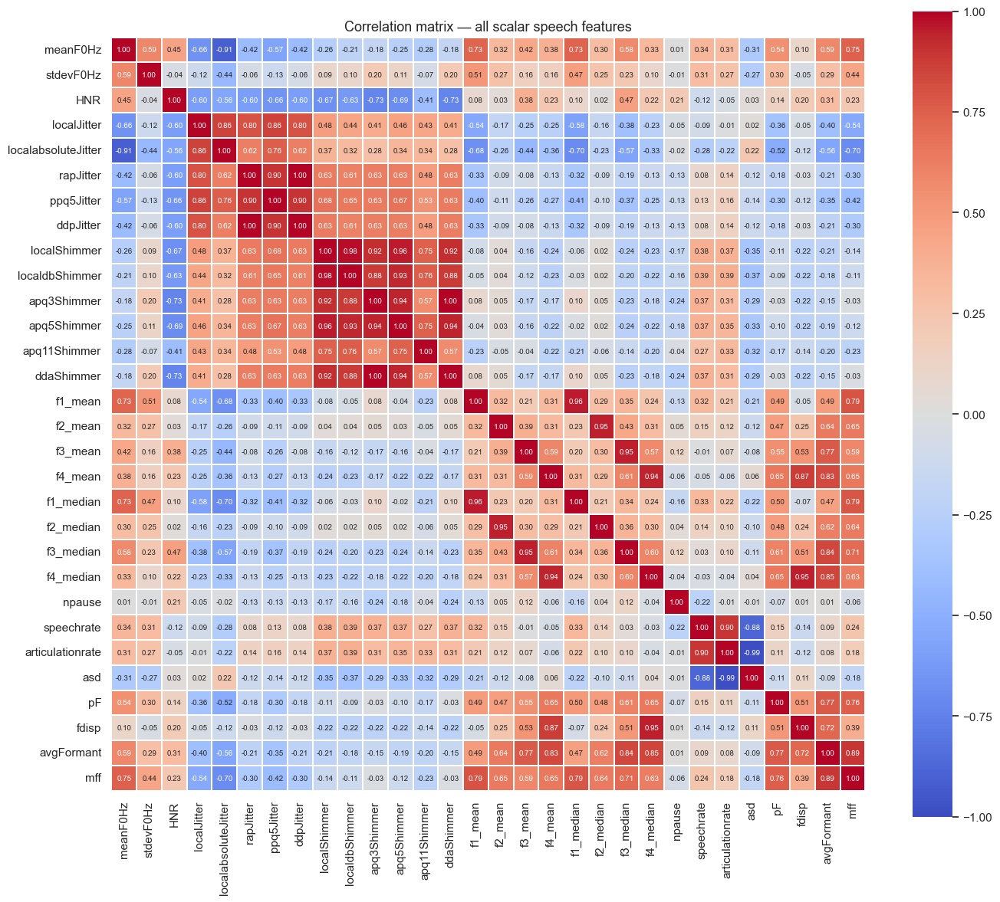

In [8]:
corr = data[scalar_cols].corr()

fig, ax = plt.subplots(figsize=(14, 12))
sns.heatmap(
    corr,
    annot=True, fmt='.2f',
    cmap='coolwarm', center=0, vmin=-1, vmax=1,
    square=True, linewidths=0.3,
    annot_kws={'size': 7},
    ax=ax
)
ax.set_title('Correlation matrix — all scalar speech features', fontsize=13)
plt.tight_layout()
plt.show()

In [9]:
# Top non-trivial cross-feature correlations (|r| > 0.4, no self-correlations)
corr_vals = corr.abs().unstack()
corr_vals = corr_vals[corr_vals < 1.0]

seen = set()
rows = []
for (a, b), v in corr_vals.sort_values(ascending=False).items():
    key = tuple(sorted([a, b]))
    if key not in seen and v > 0.4:
        seen.add(key)
        rows.append({'feature_a': a, 'feature_b': b, 'correlation': round(corr.loc[a, b], 3)})

pd.DataFrame(rows)

,feature_a,feature_b,correlation
0,apq3Shimmer,ddaShimmer,1.000
1,asd,articulationrate,-0.986
2,localShimmer,localdbShimmer,0.977
3,localShimmer,apq5Shimmer,0.959
4,f1_median,f1_mean,0.956
...,...,...,...
130,ddpJitter,meanF0Hz,-0.416
131,HNR,apq11Shimmer,-0.412
132,f1_median,ppq5Jitter,-0.408
133,apq3Shimmer,localJitter,0.406


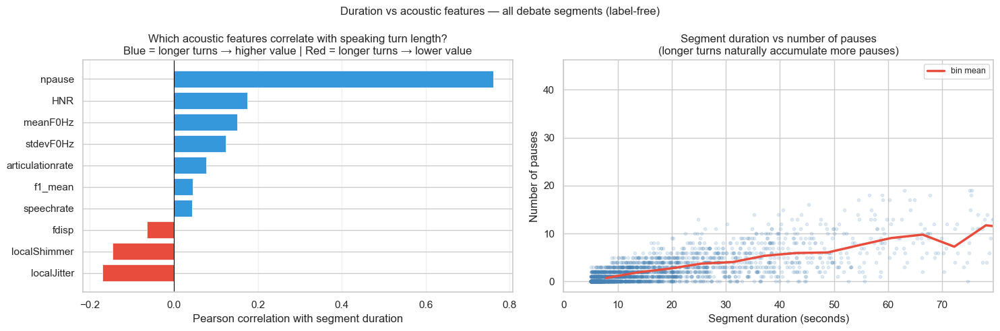

Pearson correlations: segment duration vs acoustic features
(computed on all debate segments, no speaker labels used)

  npause                r = +0.761   ↑ longer → higher
  HNR                   r = +0.176   ↑ longer → higher
  localJitter           r = -0.170   ↓ longer → lower
  meanF0Hz              r = +0.151   ↑ longer → higher
  localShimmer          r = -0.146   ↓ longer → lower
  stdevF0Hz             r = +0.123   ↑ longer → higher
  articulationrate      r = +0.077   ↑ longer → higher
  fdisp                 r = -0.064   ↓ longer → lower
  f1_mean               r = +0.046   ↑ longer → higher
  speechrate            r = +0.043   ↑ longer → higher


In [10]:
# ── CELL: Correlation between segment duration and acoustic features ──────────
# Label-free. Does how long someone speaks in a turn correlate with
# how they sound? Longer turns may show lower pitch (fatigue/relaxation),
# more pauses, different shimmer.
# We use only debate segments to avoid newscast contamination.

debate_data_all = data[data['video'].isin(debate_videos)].copy()

DURATION_FEATURES = [
    'meanF0Hz', 'stdevF0Hz', 'HNR', 'localJitter', 'localShimmer',
    'speechrate', 'articulationrate', 'npause', 'f1_mean', 'fdisp'
]

# ── Correlation bar chart: duration vs each feature ──────────────────────────
duration_corrs = {
    feat: debate_data_all['duration'].corr(debate_data_all[feat])
    for feat in DURATION_FEATURES
}
corr_series = pd.Series(duration_corrs).sort_values()

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

colors_bar = ['#e74c3c' if v < 0 else '#3498db' for v in corr_series.values]
axes[0].barh(corr_series.index, corr_series.values,
             color=colors_bar, edgecolor='white', linewidth=0.5)
axes[0].axvline(0, color='black', linewidth=0.8)
axes[0].set_xlabel('Pearson correlation with segment duration')
axes[0].set_title('Which acoustic features correlate with speaking turn length?\n'
                  'Blue = longer turns → higher value | Red = longer turns → lower value')
axes[0].grid(axis='x', alpha=0.3)

# ── Scatter: duration vs npause (strongest expected correlation) ──────────────
axes[1].scatter(
    debate_data_all['duration'],
    debate_data_all['npause'],
    alpha=0.15, s=10, color='steelblue', rasterized=True
)
# Add a smoothed trend line using rolling mean on binned data
bins = pd.cut(debate_data_all['duration'], bins=30)
trend = debate_data_all.groupby(bins, observed=True)['npause'].mean()
bin_centers = [interval.mid for interval in trend.index]
axes[1].plot(bin_centers, trend.values, color='#e74c3c', linewidth=2.5, label='bin mean')

axes[1].set_xlabel('Segment duration (seconds)')
axes[1].set_ylabel('Number of pauses')
axes[1].set_title('Segment duration vs number of pauses\n(longer turns naturally accumulate more pauses)')
axes[1].legend(fontsize=9)
axes[1].set_xlim(0, debate_data_all['duration'].quantile(0.98))

plt.suptitle('Duration vs acoustic features — all debate segments (label-free)', fontsize=12)
plt.tight_layout()
plt.show()

# ── Print the correlation table ───────────────────────────────────────────────
print('Pearson correlations: segment duration vs acoustic features')
print('(computed on all debate segments, no speaker labels used)')
print()
for feat, r in corr_series.sort_values(key=abs, ascending=False).items():
    direction = '↑ longer → higher' if r > 0 else '↓ longer → lower'
    print(f'  {feat:<20}  r = {r:+.3f}   {direction}')

## Part III — Speaker separation from embeddings

We know each debate has exactly 3 speakers: candidate A, candidate B, and a TV host.
This section asks whether the speaker embeddings themselves support `k=3`, rather than forcing that assumption.
We start with a single-debate sanity check, then rank all debates by separation quality.

The silhouette score (computed in full 512-dim cosine space) quantifies separation quality per debate.

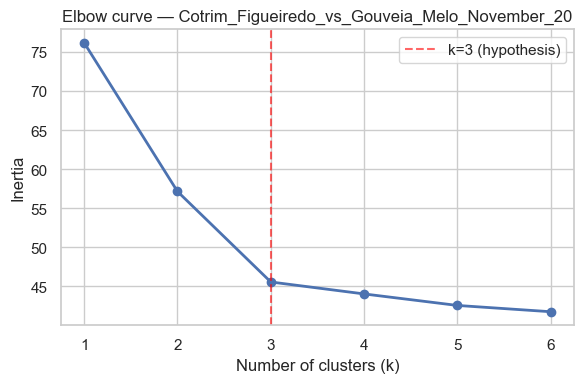

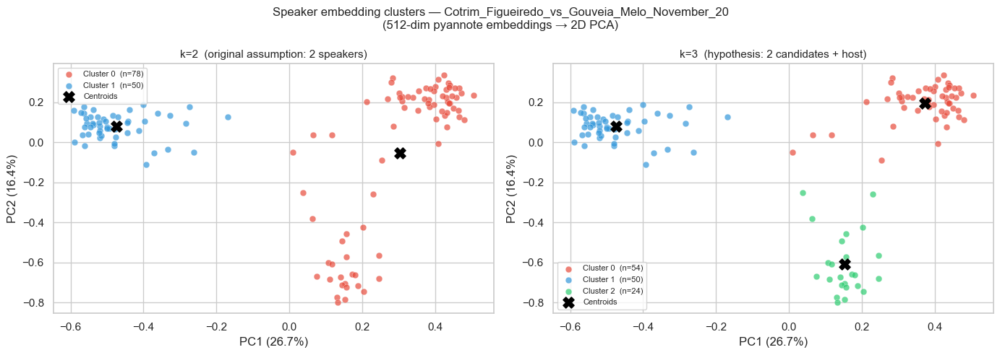

In [11]:
# First: single debate demonstration — Cotrim vs Gouveia Melo (128 segments, clear structure)
DEMO_DEBATE = 'Cotrim_Figueiredo_vs_Gouveia_Melo_November_20'

debate = data[data['video'] == DEMO_DEBATE].copy().reset_index(drop=True)
E = np.stack(debate['speak_embeddings'].values)

pca = PCA(n_components=2, random_state=42)
E_2d = pca.fit_transform(E)
var1 = pca.explained_variance_ratio_[0] * 100
var2 = pca.explained_variance_ratio_[1] * 100

ks = range(1, 7)
inertias = [KMeans(n_clusters=k, random_state=42, n_init=10).fit(E).inertia_ for k in ks]

fig, ax = plt.subplots(figsize=(6, 4))
ax.plot(list(ks), inertias, marker='o', linewidth=2)
ax.axvline(x=3, color='red', linestyle='--', alpha=0.6, label='k=3 (hypothesis)')
ax.set_xlabel('Number of clusters (k)')
ax.set_ylabel('Inertia')
ax.set_title(f'Elbow curve — {DEMO_DEBATE}')
ax.legend()
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
colors = ['#e74c3c', '#3498db', '#2ecc71']

for ax, k, title in zip(
    axes, [2, 3],
    ['k=2  (original assumption: 2 speakers)',
     'k=3  (hypothesis: 2 candidates + host)']
):
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = km.fit_predict(E)
    for i in range(k):
        mask = labels == i
        ax.scatter(E_2d[mask, 0], E_2d[mask, 1], c=colors[i],
                   label=f'Cluster {i}  (n={mask.sum()})',
                   alpha=0.7, s=40, edgecolors='white', linewidth=0.3)
    centroids_2d = pca.transform(km.cluster_centers_)
    ax.scatter(centroids_2d[:, 0], centroids_2d[:, 1],
               c='black', marker='X', s=120, zorder=5, label='Centroids')
    ax.set_title(title, fontsize=11)
    ax.set_xlabel(f'PC1 ({var1:.1f}%)')
    ax.set_ylabel(f'PC2 ({var2:.1f}%)')
    ax.legend(fontsize=8)

plt.suptitle(f'Speaker embedding clusters — {DEMO_DEBATE}\n(512-dim pyannote embeddings → 2D PCA)', fontsize=12)
plt.tight_layout()
plt.show()

### 3.2 Separation quality across all 28 debates

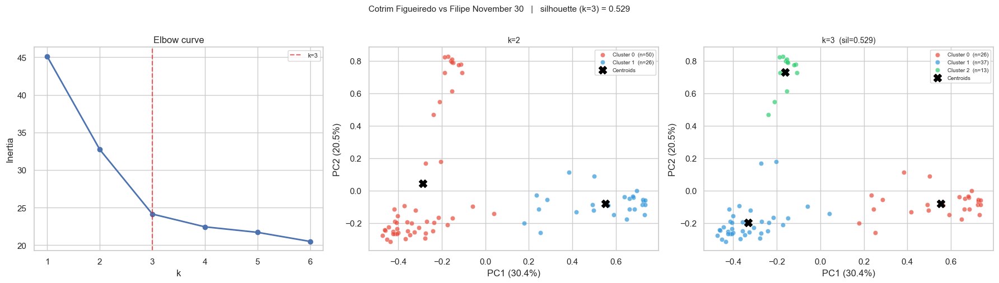

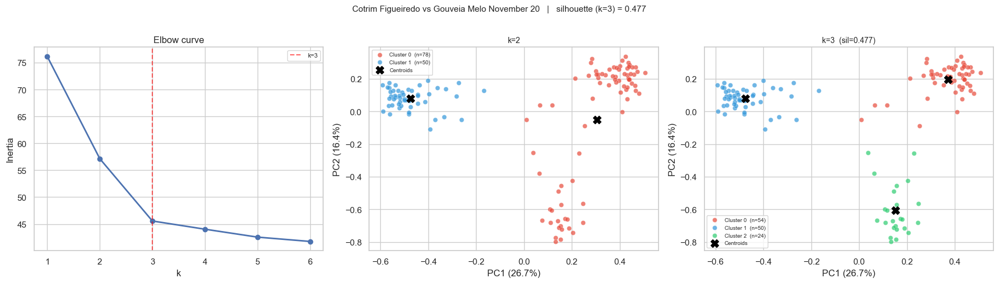

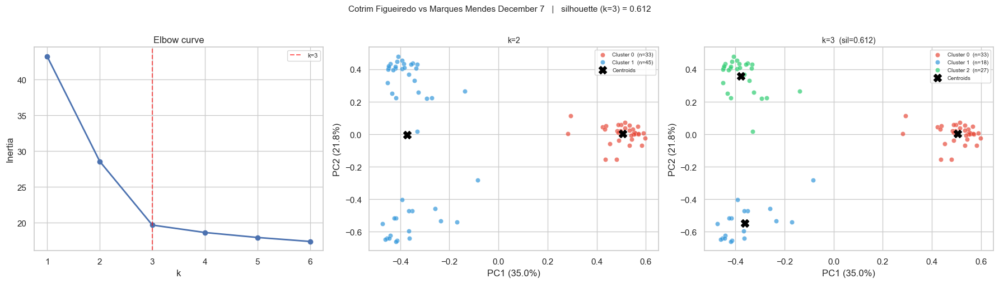

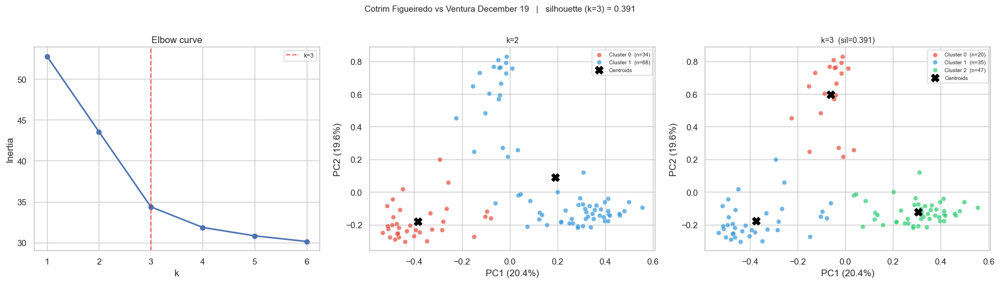

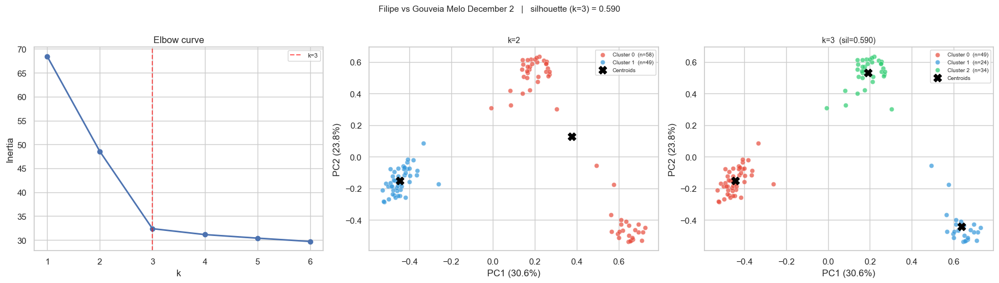

...

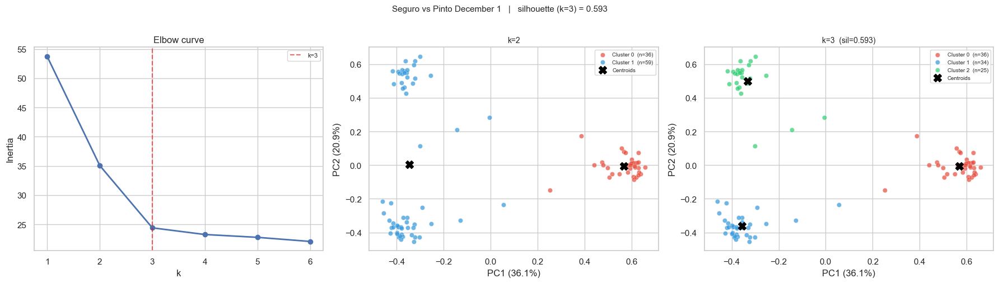

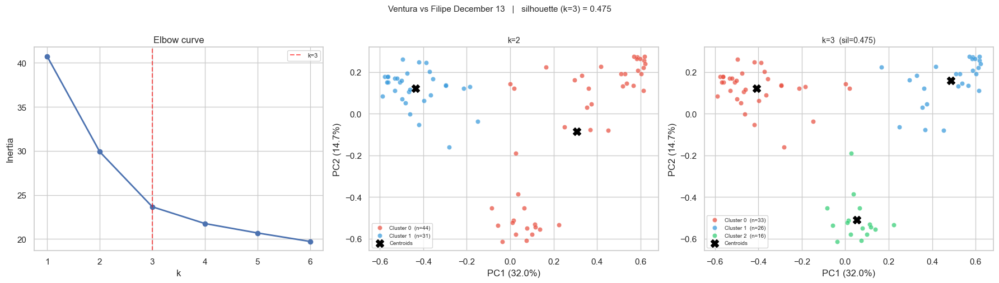

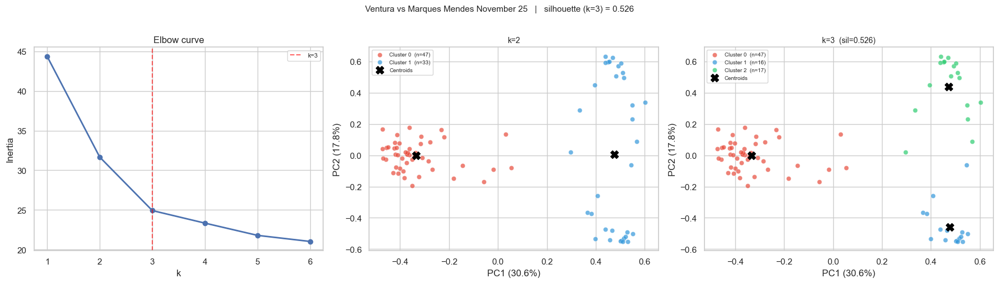

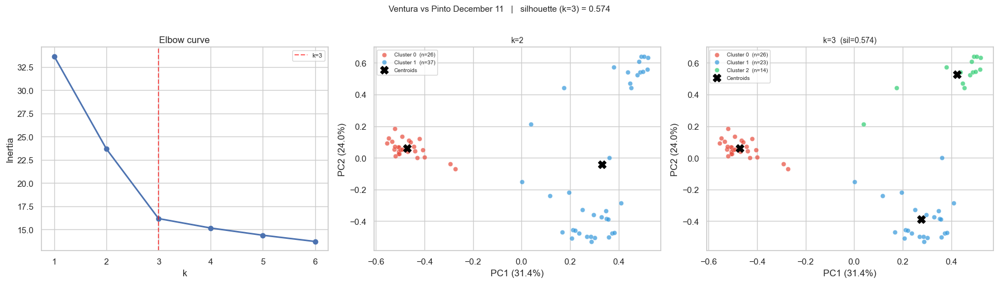

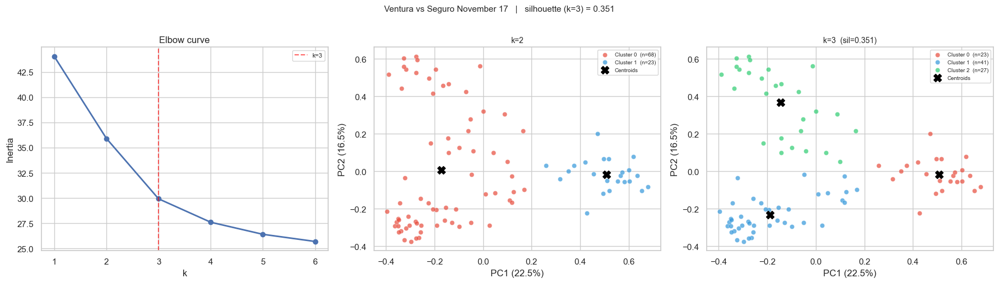

Done. quality_scores computed for 28 debates.


In [12]:
os.makedirs('figs/debate_clusters', exist_ok=True)

quality_scores = {}  # { video_name: silhouette score at k=3 }

for video_name in debate_videos:
    dbt = data[data['video'] == video_name].copy().reset_index(drop=True)
    E = np.stack(dbt['speak_embeddings'].values)

    pca = PCA(n_components=2, random_state=42)
    E_2d = pca.fit_transform(E)
    var1 = pca.explained_variance_ratio_[0] * 100
    var2 = pca.explained_variance_ratio_[1] * 100

    ks = range(1, 7)
    inertias = [KMeans(n_clusters=k, random_state=42, n_init=10).fit(E).inertia_ for k in ks]

    km3 = KMeans(n_clusters=3, random_state=42, n_init=10)
    labels_k3 = km3.fit_predict(E)
    sil = silhouette_score(E, labels_k3, metric='cosine')
    quality_scores[video_name] = sil

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle(f'{video_name.replace("_", " ")}   |   silhouette (k=3) = {sil:.3f}', fontsize=11, y=1.01)

    axes[0].plot(list(ks), inertias, marker='o', linewidth=2)
    axes[0].axvline(x=3, color='red', linestyle='--', alpha=0.6, label='k=3')
    axes[0].set_xlabel('k')
    axes[0].set_ylabel('Inertia')
    axes[0].set_title('Elbow curve')
    axes[0].legend(fontsize=8)

    colors = ['#e74c3c', '#3498db', '#2ecc71']
    for ax, k, title, precomputed in zip(
        axes[1:], [2, 3],
        ['k=2', f'k=3  (sil={sil:.3f})'],
        [None, labels_k3]
    ):
        if precomputed is None:
            km = KMeans(n_clusters=k, random_state=42, n_init=10)
            labels = km.fit_predict(E)
            centers = km.cluster_centers_
        else:
            labels = precomputed
            centers = km3.cluster_centers_

        for i in range(k):
            mask = labels == i
            ax.scatter(E_2d[mask, 0], E_2d[mask, 1], c=colors[i],
                       label=f'Cluster {i}  (n={mask.sum()})',
                       alpha=0.7, s=35, edgecolors='white', linewidth=0.3)
        centroids_2d = pca.transform(centers)
        ax.scatter(centroids_2d[:, 0], centroids_2d[:, 1],
                   c='black', marker='X', s=100, zorder=5, label='Centroids')
        ax.set_title(title, fontsize=10)
        ax.set_xlabel(f'PC1 ({var1:.1f}%)')
        ax.set_ylabel(f'PC2 ({var2:.1f}%)')
        ax.legend(fontsize=7)

    plt.tight_layout()
    plt.savefig(f'figs/debate_clusters/{video_name}.png', dpi=150, bbox_inches='tight')
    plt.show()

print(f'Done. quality_scores computed for {len(quality_scores)} debates.')

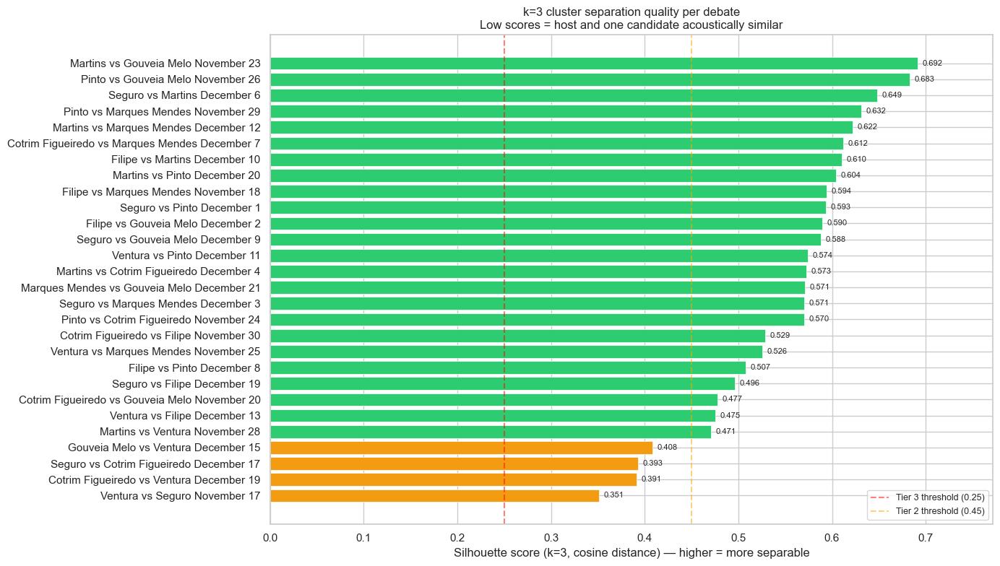

── Tier 1 — reliable   (sil >= 0.45) ──
  0.692  Martins  vs  Gouveia_Melo
  0.683  Pinto  vs  Gouveia_Melo
  0.649  Seguro  vs  Martins
  0.632  Pinto  vs  Marques_Mendes
  0.622  Martins  vs  Marques_Mendes
  0.612  Cotrim_Figueiredo  vs  Marques_Mendes
  0.610  Filipe  vs  Martins
  0.604  Martins  vs  Pinto
  0.594  Filipe  vs  Marques_Mendes
  0.593  Seguro  vs  Pinto
  0.590  Filipe  vs  Gouveia_Melo
  0.588  Seguro  vs  Gouveia_Melo
  0.574  Ventura  vs  Pinto
  0.573  Martins  vs  Cotrim_Figueiredo
  0.571  Marques_Mendes  vs  Gouveia_Melo
  0.571  Seguro  vs  Marques_Mendes
  0.570  Pinto  vs  Cotrim_Figueiredo
  0.529  Cotrim_Figueiredo  vs  Filipe
  0.526  Ventura  vs  Marques_Mendes
  0.507  Filipe  vs  Pinto
  0.496  Seguro  vs  Filipe
  0.477  Cotrim_Figueiredo  vs  Gouveia_Melo
  0.475  Ventura  vs  Filipe
  0.471  Martins  vs  Ventura

── Tier 2 — moderate   (0.25 <= sil < 0.45) ──
  0.408  Gouveia_Melo  vs  Ventura
  0.393  Seguro  vs  Cotrim_Figueiredo
  0.391  Cotrim

In [13]:
def score_to_color(s):
    if s < 0.25:   return '#e74c3c'
    elif s < 0.45: return '#f39c12'
    else:          return '#2ecc71'

sorted_debates = sorted(quality_scores.items(), key=lambda x: x[1])
names  = [v.replace('_', ' ') for v, _ in sorted_debates]
scores = [s for _, s in sorted_debates]

fig, ax = plt.subplots(figsize=(14, 8))
bars = ax.barh(names, scores,
               color=[score_to_color(s) for s in scores],
               edgecolor='white', linewidth=0.5)

for bar, s in zip(bars, scores):
    ax.text(s + 0.005, bar.get_y() + bar.get_height() / 2,
            f'{s:.3f}', va='center', fontsize=8)

ax.axvline(x=0.25, color='red',    linestyle='--', alpha=0.5, label='Tier 3 threshold (0.25)')
ax.axvline(x=0.45, color='orange', linestyle='--', alpha=0.5, label='Tier 2 threshold (0.45)')
ax.set_xlabel('Silhouette score (k=3, cosine distance) — higher = more separable')
ax.set_title('k=3 cluster separation quality per debate\nLow scores = host and one candidate acoustically similar', fontsize=12)
ax.legend(fontsize=9)
ax.set_xlim(0, max(scores) + 0.08)
plt.tight_layout()
plt.show()

for tier, label, lo, hi in [
    (1, 'Tier 1 — reliable   (sil >= 0.45)', 0.45, 1.0),
    (2, 'Tier 2 — moderate   (0.25 <= sil < 0.45)', 0.25, 0.45),
    (3, 'Tier 3 — unreliable (sil < 0.25)', 0.0, 0.25),
]:
    print(f'── {label} ──')
    for v, s in sorted(quality_scores.items(), key=lambda x: -x[1]):
        if lo <= s < hi:
            cA, cB = extract_candidates(v)
            print(f'  {s:.3f}  {cA}  vs  {cB}')
    print()

## Part IV — Cross-debate speaker labeling

**Strategy:** Each candidate appears in exactly 7 debates. Their voice embedding should be
consistent across debates. We use this structure to identify which k=3 cluster corresponds
to which candidate — and which cluster is the host.

**Pass 1:** For each candidate, look at all 7 debates they appear in. For each debate,
find the cluster (out of 3) whose centroid is most consistent with the same candidate's
clusters in all other debates (nearest-neighbour cosine distance). Average these to build
a global voice centroid per candidate.

**Pass 2:** For each debate, assign the 3 clusters to candidateA, candidateB, and host
by nearest cosine distance to the global centroids.

In [14]:
# ── k=3 clustering for all debates — store cluster labels and centroids ───────
debate_centroids = {}   # { video_name: np.array (3, 512) }
cluster_col = np.full(len(data), -1, dtype=int)

for video_name in debate_videos:
    mask = data['video'] == video_name
    idx  = data.index[mask]
    E    = np.stack(data.loc[idx, 'speak_embeddings'].values)

    km   = KMeans(n_clusters=3, random_state=42, n_init=10)
    lbls = km.fit_predict(E)

    cluster_col[idx] = lbls
    debate_centroids[video_name] = km.cluster_centers_

data['cluster_k3'] = cluster_col
print(f'k=3 clustering done. Centroids stored for {len(debate_centroids)} debates.')

k=3 clustering done. Centroids stored for 28 debates.


In [15]:
# ── Pass 1: find best-matching cluster per candidate per debate ────────────────
def find_candidate_centroid_per_debate(candidate, debate_centroids):
    their_debates = [v for v in debate_centroids if candidate in v]
    if len(their_debates) < 2:
        return {}

    best_centroids = {}
    for video in their_debates:
        other_videos = [v for v in their_debates if v != video]
        centroids_here = debate_centroids[video]  # (3, 512)

        scores = []
        for c_idx in range(3):
            c_vec = centroids_here[c_idx]
            total_dist = 0.0
            for other_v in other_videos:
                dists = cdist(c_vec.reshape(1, -1), debate_centroids[other_v], metric='cosine')[0]
                total_dist += dists.min()
            scores.append(total_dist)

        best_centroids[video] = centroids_here[int(np.argmin(scores))]
    return best_centroids

print('Computing cross-debate centroid anchors...')
candidate_debate_centroids = {}
for cand in CANDIDATES:
    result = find_candidate_centroid_per_debate(cand, debate_centroids)
    candidate_debate_centroids[cand] = result
    print(f'  {cand}: anchored in {len(result)} debates')

# ── Build global centroid per candidate ───────────────────────────────────────
global_centroids = {}
for cand in CANDIDATES:
    vecs = list(candidate_debate_centroids[cand].values())
    if vecs:
        global_centroids[cand] = np.mean(np.stack(vecs), axis=0)

print(f'\nGlobal centroids built for {len(global_centroids)} candidates.')

Computing cross-debate centroid anchors...
  Cotrim_Figueiredo: anchored in 7 debates
  Filipe: anchored in 7 debates
  Gouveia_Melo: anchored in 7 debates
  Marques_Mendes: anchored in 7 debates
  Martins: anchored in 7 debates
  Pinto: anchored in 7 debates
  Seguro: anchored in 7 debates
  Ventura: anchored in 7 debates

Global centroids built for 8 candidates.


In [16]:
# ── Pass 2: assign speaker labels using global centroids ──────────────────────
speaker_col = np.full(len(data), 'unknown', dtype=object)

for video_name in debate_videos:
    cA, cB = extract_candidates(video_name)
    if cA is None:
        continue

    mask = data['video'] == video_name
    idx  = data.index[mask]
    centroids = debate_centroids[video_name]  # (3, 512)

    dist_A = cdist(centroids, global_centroids[cA].reshape(1, -1), metric='cosine').flatten()
    dist_B = cdist(centroids, global_centroids[cB].reshape(1, -1), metric='cosine').flatten()

    cluster_to_speaker = {}
    available = {0, 1, 2}

    best_A = int(np.argmin([dist_A[i] if i in available else np.inf for i in range(3)]))
    cluster_to_speaker[best_A] = cA
    available.remove(best_A)

    best_B = int(np.argmin([dist_B[i] if i in available else np.inf for i in range(3)]))
    cluster_to_speaker[best_B] = cB
    available.remove(best_B)

    cluster_to_speaker[available.pop()] = 'host'

    labels_k3 = data.loc[idx, 'cluster_k3'].values
    speaker_col[idx] = [cluster_to_speaker[l] for l in labels_k3]

data['speaker'] = speaker_col
data['party'] = data['speaker'].map(candidate_to_party).fillna('host')

print('Segment counts by speaker label:')
print(data[data['video'].isin(debate_videos)]['speaker'].value_counts())
print()
print('Host segments per debate:')
host_counts = (
    data[data['video'].isin(debate_videos)]
    .groupby('video')['speaker']
    .apply(lambda x: (x == 'host').sum())
    .sort_values(ascending=False)
)
print(host_counts.to_string())

Segment counts by speaker label:
speaker
host                 549
Marques_Mendes       336
Gouveia_Melo         330
Seguro               293
Cotrim_Figueiredo    281
Martins              260
Filipe               242
Ventura              195
Pinto                170
Name: count, dtype: int64

Host segments per debate:
video
Pinto_vs_Gouveia_Melo_November_26                 29
Ventura_vs_Seguro_November_17                     27
Gouveia_Melo_vs_Ventura_December_15               26
Filipe_vs_Martins_December_10                     26
Seguro_vs_Pinto_December_1                        25
Cotrim_Figueiredo_vs_Gouveia_Melo_November_20     24
Filipe_vs_Gouveia_Melo_December_2                 24
Martins_vs_Cotrim_Figueiredo_December_4           22
Martins_vs_Marques_Mendes_December_12             22
Seguro_vs_Marques_Mendes_December_3               22
Cotrim_Figueiredo_vs_Ventura_December_19          20
Filipe_vs_Pinto_December_8                        20
Martins_vs_Ventura_November_28         

## Part V — Single-debate case study: Martins vs Gouveia Melo

We validate on `Martins_vs_Gouveia_Melo_November_23` — the highest silhouette score (0.692),
meaning the cleanest three-cluster separation.

This part contains three complementary views:
1. label validation in embedding space + speaking time split
2. temporal turn-taking through the debate
3. a focused acoustic comparison of `Martins`, `Gouveia_Melo`, and the `host`

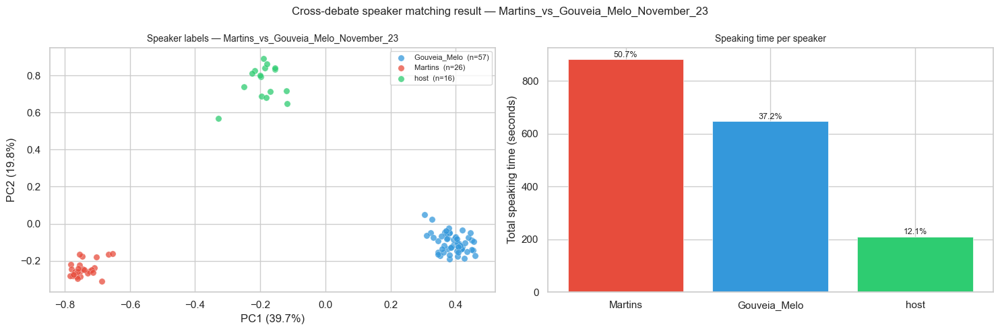


Speaking time summary for Martins_vs_Gouveia_Melo_November_23:
  Martins                     882.7s  (50.7%)  —  26 segments
  Gouveia_Melo                647.7s  (37.2%)  —  57 segments
  host                        210.4s  (12.1%)  —  16 segments


In [17]:
DEBATE = 'Martins_vs_Gouveia_Melo_November_23'

debate_data = data[data['video'] == DEBATE].copy().reset_index(drop=True)
E = np.stack(debate_data['speak_embeddings'].values)

pca = PCA(n_components=2, random_state=42)
E_2d = pca.fit_transform(E)

speakers = debate_data['speaker'].values
unique_speakers = sorted(set(speakers))
colors = {'Martins': '#e74c3c', 'Gouveia_Melo': '#3498db', 'host': '#2ecc71'}

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

ax = axes[0]
for spk in unique_speakers:
    mask = speakers == spk
    ax.scatter(E_2d[mask, 0], E_2d[mask, 1],
               c=colors.get(spk, '#888888'), label=f'{spk}  (n={mask.sum()})',
               alpha=0.75, s=45, edgecolors='white', linewidth=0.3)
ax.set_title(f'Speaker labels — {DEBATE}', fontsize=10)
ax.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)')
ax.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)')
ax.legend(fontsize=8)

ax = axes[1]
time_per_speaker = debate_data.groupby('speaker')['duration'].sum().sort_values(ascending=False)
total_time = time_per_speaker.sum()

bars = ax.bar(
    time_per_speaker.index, time_per_speaker.values,
    color=[colors.get(s, '#888888') for s in time_per_speaker.index],
    edgecolor='white', linewidth=0.5
)
for bar, val in zip(bars, time_per_speaker.values):
    pct = val / total_time * 100
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
            f'{pct:.1f}%', ha='center', va='bottom', fontsize=9)

ax.set_ylabel('Total speaking time (seconds)')
ax.set_title('Speaking time per speaker', fontsize=10)

plt.suptitle(f'Cross-debate speaker matching result — {DEBATE}', fontsize=12)
plt.tight_layout()
plt.show()

print(f'\nSpeaking time summary for {DEBATE}:')
for spk, t in time_per_speaker.items():
    pct = t / total_time * 100
    n   = (debate_data['speaker'] == spk).sum()
    print(f'  {spk:<25}  {t:6.1f}s  ({pct:.1f}%)  —  {n} segments')

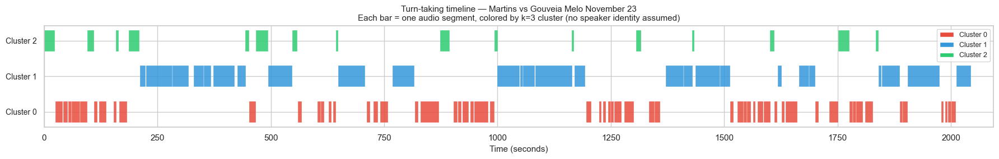

Turn statistics by cluster — Martins_vs_Gouveia_Melo_November_23:
  Cluster 0: 57 segments | mean duration 11.4s | median 8.7s | total 648s
  Cluster 1: 26 segments | mean duration 34.0s | median 29.3s | total 883s
  Cluster 2: 16 segments | mean duration 13.2s | median 10.4s | total 210s


In [18]:
# ── CELL: Temporal turn-taking timeline ───────────────────────────────────────
# For one debate, plot each audio segment as a horizontal bar on a time axis.
# Colored by k=3 cluster label (no candidate names — purely geometric).
# Shows turn-taking rhythm, turn lengths, and whether one cluster (host)
# has visibly shorter and more evenly-spaced interjections.

TIMELINE_DEBATE = 'Martins_vs_Gouveia_Melo_November_23'  # highest silhouette score

dbt = data[data['video'] == TIMELINE_DEBATE].copy().sort_values('time stamp').reset_index(drop=True)

# k=3 labels for this debate (already computed in cluster_k3 column)
cluster_colors = {0: '#e74c3c', 1: '#3498db', 2: '#2ecc71'}
cluster_labels = {0: 'Cluster 0', 1: 'Cluster 1', 2: 'Cluster 2'}

fig, ax = plt.subplots(figsize=(18, 3))

for _, row in dbt.iterrows():
    c = int(row['cluster_k3'])
    ax.barh(
        y=c,
        width=row['duration'],
        left=row['time stamp'],
        height=0.6,
        color=cluster_colors[c],
        alpha=0.85,
        edgecolor='white',
        linewidth=0.3
    )

ax.set_yticks([0, 1, 2])
ax.set_yticklabels([cluster_labels[i] for i in [0, 1, 2]], fontsize=10)
ax.set_xlabel('Time (seconds)', fontsize=11)
ax.set_title(
    f'Turn-taking timeline — {TIMELINE_DEBATE.replace("_", " ")}\n'
    f'Each bar = one audio segment, colored by k=3 cluster (no speaker identity assumed)',
    fontsize=11
)
ax.set_xlim(0, dbt['time stamp'].max() + dbt['duration'].max())

# Add legend
from matplotlib.patches import Patch
legend_elements = [Patch(facecolor=cluster_colors[i], label=cluster_labels[i]) for i in range(3)]
ax.legend(handles=legend_elements, loc='upper right', fontsize=9)

plt.tight_layout()
plt.show()

# Print basic turn stats per cluster
print(f'Turn statistics by cluster — {TIMELINE_DEBATE}:')
for c in [0, 1, 2]:
    sub = dbt[dbt['cluster_k3'] == c]
    print(f'  Cluster {c}: {len(sub)} segments | '
          f'mean duration {sub["duration"].mean():.1f}s | '
          f'median {sub["duration"].median():.1f}s | '
          f'total {sub["duration"].sum():.0f}s')

,segments,total_duration,mean_duration,median_duration,meanF0Hz_mean,meanF0Hz_median,stdevF0Hz_mean,stdevF0Hz_median,HNR_mean,HNR_median,speechrate_mean,speechrate_median,f1_mean_mean,f1_mean_median,f2_mean_mean,f2_mean_median
speaker,,,,,,,,,,,,,,,,
Martins,26,882.731,33.951,29.328,220.554,222.889,39.499,40.813,12.764,12.851,4.908,4.978,528.006,528.805,1417.267,1417.131
Gouveia_Melo,57,647.696,11.363,8.674,135.160,133.878,27.148,27.696,10.051,10.191,4.175,4.145,431.575,429.597,1358.896,1359.394
host,16,210.449,13.153,10.420,178.609,179.194,31.278,30.376,11.494,11.337,4.912,4.867,505.067,502.681,1489.114,1495.879


C:\Users\dinis\AppData\Local\Temp\ipykernel_14428\4115561377.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\dinis\AppData\Local\Temp\ipykernel_14428\4115561377.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\dinis\AppData\Local\Temp\ipykernel_14428\4115561377.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\dinis\AppData\Local\Temp\ipykernel_14428\4115561377.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `h

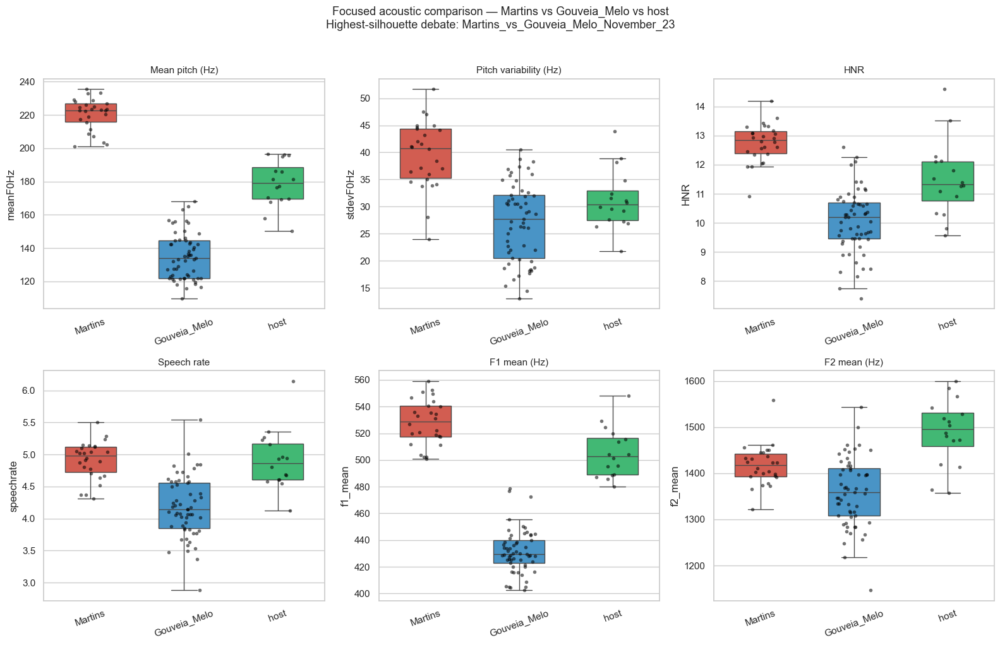

,feature,label,pair,median_a,median_b,mannwhitney_p,cliffs_delta
6,HNR,HNR,Martins vs Gouveia_Melo,12.8508,10.1913,0.0000,0.9595
8,HNR,HNR,Gouveia_Melo vs host,10.1913,11.3370,0.0001,-0.6250
7,HNR,HNR,Martins vs host,12.8508,11.3370,0.0004,0.6587
12,f1_mean,F1 mean (Hz),Martins vs Gouveia_Melo,528.8047,429.5972,0.0000,1.0000
14,f1_mean,F1 mean (Hz),Gouveia_Melo vs host,429.5972,502.6809,0.0000,-1.0000
13,f1_mean,F1 mean (Hz),Martins vs host,528.8047,502.6809,0.0008,0.6250
17,f2_mean,F2 mean (Hz),Gouveia_Melo vs host,1359.3941,1495.8791,0.0000,-0.7895
15,f2_mean,F2 mean (Hz),Martins vs Gouveia_Melo,1417.1312,1359.3941,0.0004,0.4899
16,f2_mean,F2 mean (Hz),Martins vs host,1417.1312,1495.8791,0.0015,-0.5913
0,meanF0Hz,Mean pitch (Hz),Martins vs Gouveia_Melo,222.8894,133.8776,0.0000,1.0000


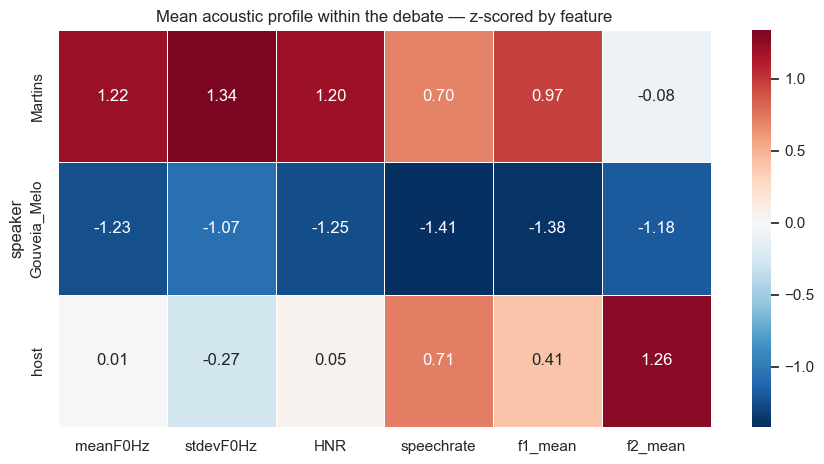

Host profile distance in z-scored feature space (smaller = more similar):
speaker
Martins         2.731
Gouveia_Melo    4.194



,feature,label,host_mean,closest_to_host,abs_diff
0,meanF0Hz,Mean pitch (Hz),178.609,Martins,41.946
1,stdevF0Hz,Pitch variability (Hz),31.278,Gouveia_Melo,4.130
2,HNR,HNR,11.494,Martins,1.271
3,speechrate,Speech rate,4.912,Martins,0.004
4,f1_mean,F1 mean (Hz),505.067,Martins,22.939
5,f2_mean,F2 mean (Hz),1489.114,Martins,71.847


Interpretation note: if the host is closer to Martins on pitch/formants, that may suggest
a more similar vocal profile in this debate, but it is not enough to infer exact gender or age.


In [19]:
# ── CELL: Focused acoustic comparison — Martins vs Gouveia_Melo vs host ─────
# Descriptive only: acoustic similarity can suggest vocal-profile overlap,
# but it does NOT identify a speaker's gender or age with certainty.

from scipy.stats import mannwhitneyu

FOCUS_DEBATE = 'Martins_vs_Gouveia_Melo_November_23'
FOCUS_SPEAKERS = ['Martins', 'Gouveia_Melo', 'host']
FOCUS_FEATURES = [
    ('meanF0Hz',  'Mean pitch (Hz)'),
    ('stdevF0Hz', 'Pitch variability (Hz)'),
    ('HNR',       'HNR'),
    ('speechrate','Speech rate'),
    ('f1_mean',   'F1 mean (Hz)'),
    ('f2_mean',   'F2 mean (Hz)'),
]

focus_palette = {'Martins': '#e74c3c', 'Gouveia_Melo': '#3498db', 'host': '#2ecc71'}
focus_order = FOCUS_SPEAKERS

focus_data = data[
    (data['video'] == FOCUS_DEBATE) &
    (data['speaker'].isin(FOCUS_SPEAKERS))
].copy()

focus_summary = focus_data.groupby('speaker').agg(
    segments=('duration', 'size'),
    total_duration=('duration', 'sum'),
    mean_duration=('duration', 'mean'),
    median_duration=('duration', 'median')
)
for feat, _ in FOCUS_FEATURES:
    focus_summary[f'{feat}_mean'] = focus_data.groupby('speaker')[feat].mean()
    focus_summary[f'{feat}_median'] = focus_data.groupby('speaker')[feat].median()
focus_summary = focus_summary.reindex(focus_order)

display(focus_summary.round(3))

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes = axes.flatten()

for ax, (feat, label) in zip(axes, FOCUS_FEATURES):
    sns.boxplot(
        data=focus_data, x='speaker', y=feat,
        order=focus_order,
        palette=focus_palette,
        ax=ax, fliersize=0, width=0.55
    )
    sns.stripplot(
        data=focus_data, x='speaker', y=feat,
        order=focus_order,
        ax=ax, color='black', alpha=0.55, size=4, jitter=0.18
    )
    ax.set_title(label, fontsize=11)
    ax.set_xlabel('')
    ax.tick_params(axis='x', rotation=20)

plt.suptitle(
    'Focused acoustic comparison — Martins vs Gouveia_Melo vs host\n'
    'Highest-silhouette debate: Martins_vs_Gouveia_Melo_November_23',
    fontsize=13, y=1.02
)
plt.tight_layout()
plt.show()

def cliffs_delta(x, y):
    x = np.asarray(x)
    y = np.asarray(y)
    gt = sum((xi > y).sum() for xi in x)
    lt = sum((xi < y).sum() for xi in x)
    return (gt - lt) / (len(x) * len(y))

pairs = [
    ('Martins', 'Gouveia_Melo'),
    ('Martins', 'host'),
    ('Gouveia_Melo', 'host')
]

test_rows = []
for feat, label in FOCUS_FEATURES:
    for a, b in pairs:
        xa = focus_data.loc[focus_data['speaker'] == a, feat].dropna().values
        xb = focus_data.loc[focus_data['speaker'] == b, feat].dropna().values
        stat, p = mannwhitneyu(xa, xb, alternative='two-sided')
        delta = cliffs_delta(xa, xb)
        test_rows.append({
            'feature': feat,
            'label': label,
            'pair': f'{a} vs {b}',
            'median_a': np.median(xa),
            'median_b': np.median(xb),
            'mannwhitney_p': p,
            'cliffs_delta': delta
        })

tests_df = pd.DataFrame(test_rows).sort_values(['feature', 'mannwhitney_p'])
display(tests_df.round(4))

focus_profile = (
    focus_data.groupby('speaker')[[feat for feat, _ in FOCUS_FEATURES]]
    .mean()
    .reindex(focus_order)
)
focus_profile_z = pd.DataFrame(
    StandardScaler().fit_transform(focus_profile),
    index=focus_profile.index,
    columns=focus_profile.columns
)

fig, ax = plt.subplots(figsize=(9, 4.8))
sns.heatmap(
    focus_profile_z,
    annot=True, fmt='.2f',
    cmap='RdBu_r', center=0,
    linewidths=0.4,
    ax=ax
)
ax.set_title('Mean acoustic profile within the debate — z-scored by feature', fontsize=12)
plt.tight_layout()
plt.show()

host_vec = focus_profile_z.loc['host']
host_dist = ((focus_profile_z.drop(index='host') - host_vec) ** 2).sum(axis=1) ** 0.5
print('Host profile distance in z-scored feature space (smaller = more similar):')
print(host_dist.sort_values().round(3).to_string())
print()

closest_by_feature = []
for feat, label in FOCUS_FEATURES:
    host_mean = focus_profile.loc['host', feat]
    diffs = {
        spk: abs(focus_profile.loc[spk, feat] - host_mean)
        for spk in ['Martins', 'Gouveia_Melo']
    }
    closest = min(diffs, key=diffs.get)
    closest_by_feature.append({
        'feature': feat,
        'label': label,
        'host_mean': host_mean,
        'closest_to_host': closest,
        'abs_diff': diffs[closest]
    })
display(pd.DataFrame(closest_by_feature).round(3))

print('Interpretation note: if the host is closer to Martins on pitch/formants, that may suggest')
print('a more similar vocal profile in this debate, but it is not enough to infer exact gender or age.')


## Part VI — Across-candidate acoustic profiles

Now that we have speaker labels, we can analyze acoustic features per candidate.
We exclude `host` segments since hosts vary across debates and are not our subjects of interest.

**Important caveat:** Labels for Tier 2 debates (Ventura-involved) are less reliable.
Ventura's segments in those debates may be partially misattributed.

In [20]:
# Work only with candidate segments (exclude host and non-debate videos)
candidates_data = data[
    data['video'].isin(debate_videos) &
    (data['speaker'] != 'host') &
    (data['speaker'] != 'unknown')
].copy()

candidates = sorted(candidates_data['speaker'].unique())
palette = sns.color_palette('tab10', len(candidates))
color_map = dict(zip(candidates, palette))

print('Segments per candidate (host excluded):')
print(candidates_data['speaker'].value_counts())
print()
print('Total speaking time per candidate (seconds):')
total_time = candidates_data.groupby('speaker')['duration'].sum().sort_values(ascending=False)
print(total_time.round(1).to_string())

Segments per candidate (host excluded):
speaker
Marques_Mendes       336
Gouveia_Melo         330
Seguro               293
Cotrim_Figueiredo    281
Martins              260
Filipe               242
Ventura              195
Pinto                170
Name: count, dtype: int64

Total speaking time per candidate (seconds):
speaker
Ventura              6806.8
Marques_Mendes       6000.9
Pinto                5937.2
Filipe               5798.0
Cotrim_Figueiredo    5736.3
Martins              5721.0
Seguro               5413.8
Gouveia_Melo         3546.6


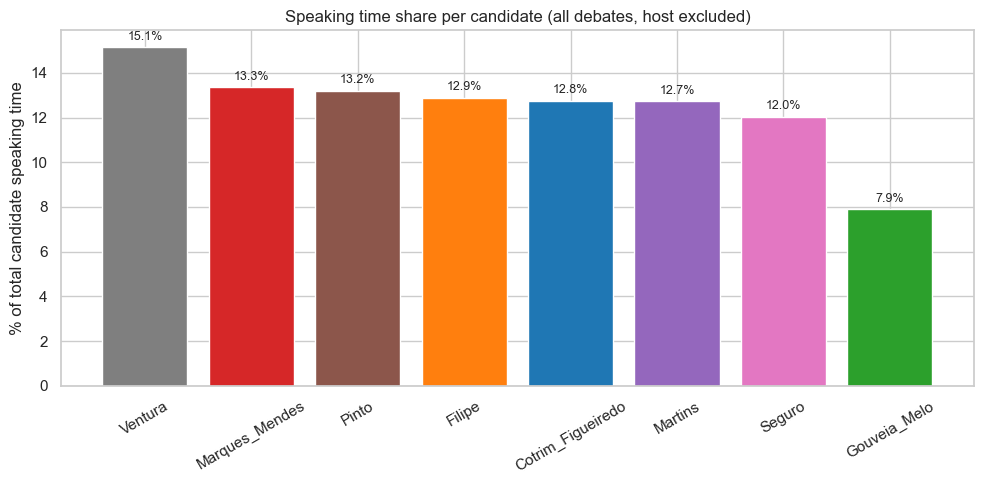

In [21]:
# Speaking time share — bar chart across all debates
total_time_all = candidates_data['duration'].sum()
time_share = (candidates_data.groupby('speaker')['duration'].sum() / total_time_all * 100).sort_values(ascending=False)

fig, ax = plt.subplots(figsize=(10, 5))
bars = ax.bar(time_share.index, time_share.values,
              color=[color_map[c] for c in time_share.index],
              edgecolor='white')
for bar, val in zip(bars, time_share.values):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.2,
            f'{val:.1f}%', ha='center', va='bottom', fontsize=9)
ax.set_ylabel('% of total candidate speaking time')
ax.set_title('Speaking time share per candidate (all debates, host excluded)', fontsize=12)
ax.tick_params(axis='x', rotation=30)
plt.tight_layout()
plt.show()

C:\Users\dinis\AppData\Local\Temp\ipykernel_14428\2818626802.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


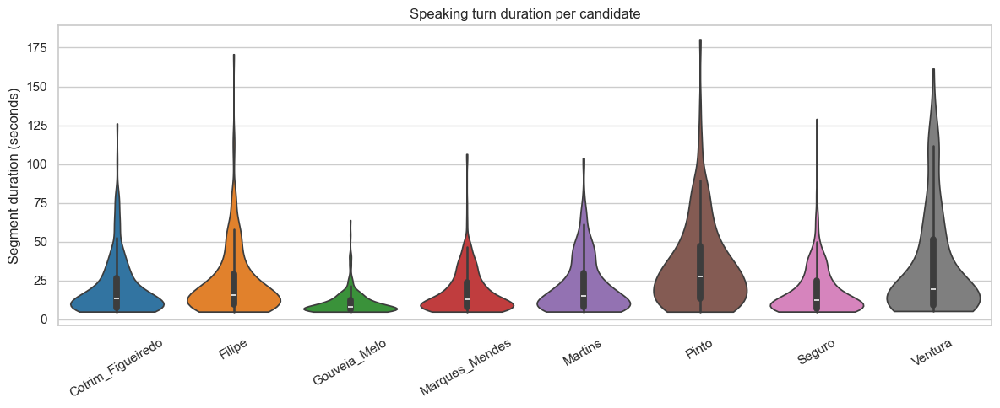

In [22]:
# Segment duration distribution per candidate — violin plot
fig, ax = plt.subplots(figsize=(12, 5))
sns.violinplot(
    data=candidates_data, x='speaker', y='duration',
    order=candidates, palette='tab10', ax=ax, cut=0
)
ax.set_xlabel('')
ax.set_ylabel('Segment duration (seconds)')
ax.set_title('Speaking turn duration per candidate', fontsize=12)
ax.tick_params(axis='x', rotation=30)
plt.tight_layout()
plt.show()

C:\Users\dinis\AppData\Local\Temp\ipykernel_14428\2705070858.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\dinis\AppData\Local\Temp\ipykernel_14428\2705070858.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\dinis\AppData\Local\Temp\ipykernel_14428\2705070858.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\dinis\AppData\Local\Temp\ipykernel_14428\2705070858.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` 

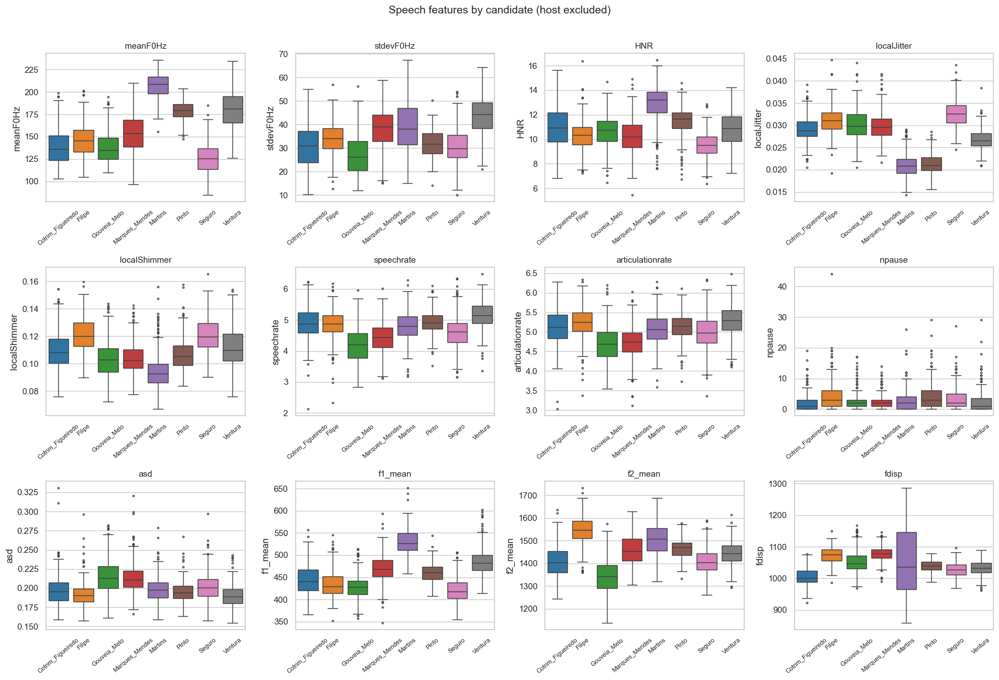

In [23]:
# Box plots of key acoustic features per candidate
fig, axes = plt.subplots(3, 4, figsize=(18, 12))
axes = axes.flatten()

for i, col in enumerate(KEY_FEATURES):
    plot_data = candidates_data[['speaker', col]].dropna()
    sns.boxplot(
        data=plot_data, x='speaker', y=col,
        ax=axes[i], palette='tab10',
        order=candidates, fliersize=2
    )
    axes[i].set_title(col, fontsize=11)
    axes[i].set_xlabel('')
    axes[i].tick_params(axis='x', rotation=40, labelsize=8)

plt.suptitle('Speech features by candidate (host excluded)', fontsize=14, y=1.01)
plt.tight_layout()
plt.show()

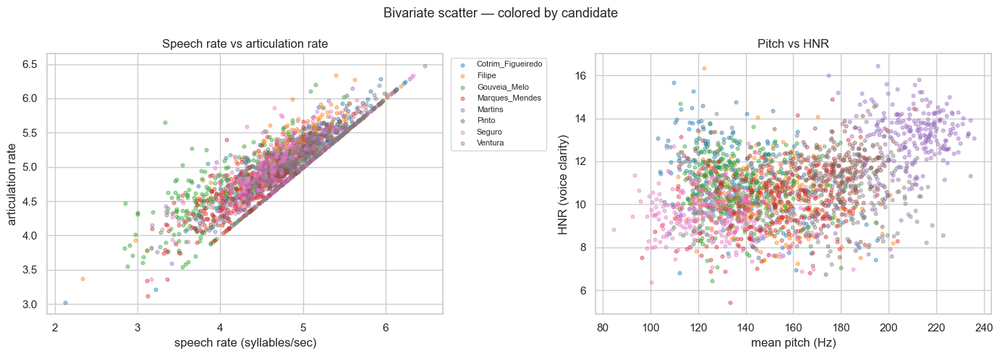

In [24]:
# Bivariate scatter: speech rate vs pitch, colored by candidate
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for cand in candidates:
    sub = candidates_data[candidates_data['speaker'] == cand]
    axes[0].scatter(sub['speechrate'], sub['articulationrate'],
                    alpha=0.4, s=12, label=cand, color=color_map[cand])

axes[0].set_xlabel('speech rate (syllables/sec)')
axes[0].set_ylabel('articulation rate')
axes[0].set_title('Speech rate vs articulation rate')
axes[0].legend(fontsize=8, bbox_to_anchor=(1.01, 1), loc='upper left')

for cand in candidates:
    sub = candidates_data[candidates_data['speaker'] == cand]
    axes[1].scatter(sub['meanF0Hz'], sub['HNR'],
                    alpha=0.4, s=12, label=cand, color=color_map[cand])

axes[1].set_xlabel('mean pitch (Hz)')
axes[1].set_ylabel('HNR (voice clarity)')
axes[1].set_title('Pitch vs HNR')

plt.suptitle('Bivariate scatter — colored by candidate', fontsize=13)
plt.tight_layout()
plt.show()

In [25]:
# Mean feature profile per candidate — summary table
profile = candidates_data.groupby('speaker')[KEY_FEATURES].mean().round(3)
profile

,meanF0Hz,stdevF0Hz,HNR,localJitter,localShimmer,speechrate,articulationrate,npause,asd,f1_mean,f2_mean,fdisp
speaker,,,,,,,,,,,,
Cotrim_Figueiredo,138.901,30.824,10.994,0.029,0.110,4.887,5.114,2.370,0.197,444.294,1409.672,1004.954
Filipe,146.061,33.927,10.335,0.031,0.121,4.845,5.221,4.260,0.193,434.131,1547.514,1072.432
Gouveia_Melo,138.577,27.107,10.657,0.030,0.103,4.188,4.703,2.452,0.215,428.329,1341.260,1054.000
Marques_Mendes,153.167,38.163,10.204,0.030,0.104,4.433,4.729,2.333,0.213,468.822,1458.663,1077.717
Martins,207.531,39.283,12.921,0.021,0.095,4.811,5.063,2.896,0.199,529.677,1509.766,1056.463
Pinto,179.363,32.092,11.487,0.021,0.108,4.931,5.143,4.335,0.195,461.455,1465.834,1039.732
Seguro,126.446,30.907,9.554,0.033,0.121,4.626,4.998,3.563,0.202,421.421,1409.298,1026.633
Ventura,178.980,43.306,10.791,0.027,0.113,5.154,5.287,2.800,0.190,486.098,1445.264,1031.651


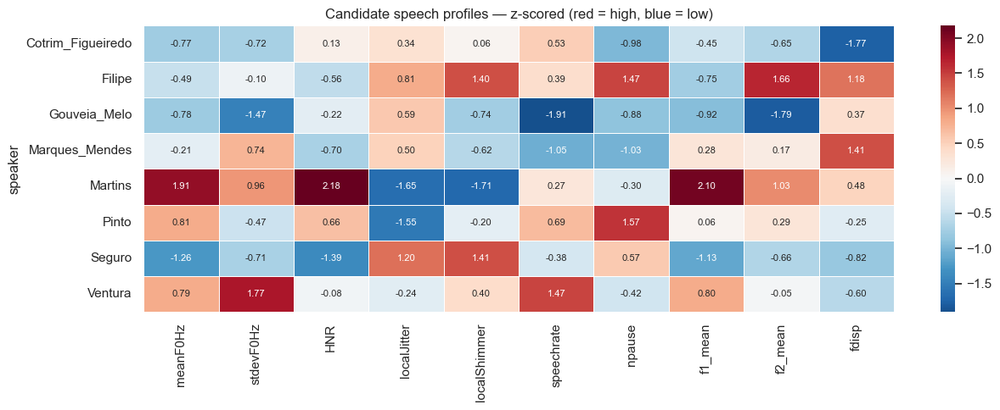

In [26]:
# Normalized feature profile heatmap — who is high/low on each feature?
# Use only non-redundant features (drop correlated pairs identified in section 4)
NON_REDUNDANT = [
    'meanF0Hz', 'stdevF0Hz', 'HNR', 'localJitter', 'localShimmer',
    'speechrate', 'npause', 'f1_mean', 'f2_mean', 'fdisp'
    # dropped: articulationrate (r=-0.99 with asd), asd (redundant)
]

profile_nr = candidates_data.groupby('speaker')[NON_REDUNDANT].mean()
scaler = StandardScaler()
profile_norm = pd.DataFrame(
    scaler.fit_transform(profile_nr),
    index=profile_nr.index, columns=profile_nr.columns
)

fig, ax = plt.subplots(figsize=(13, 5))
sns.heatmap(
    profile_norm,
    annot=True, fmt='.2f',
    cmap='RdBu_r', center=0,
    linewidths=0.4, annot_kws={'size': 8},
    ax=ax
)
ax.set_title('Candidate speech profiles — z-scored (red = high, blue = low)', fontsize=12)
plt.tight_layout()
plt.show()

Embedding matrix: (2107, 512)
Explained variance: PC1=12.1%  PC2=11.9%


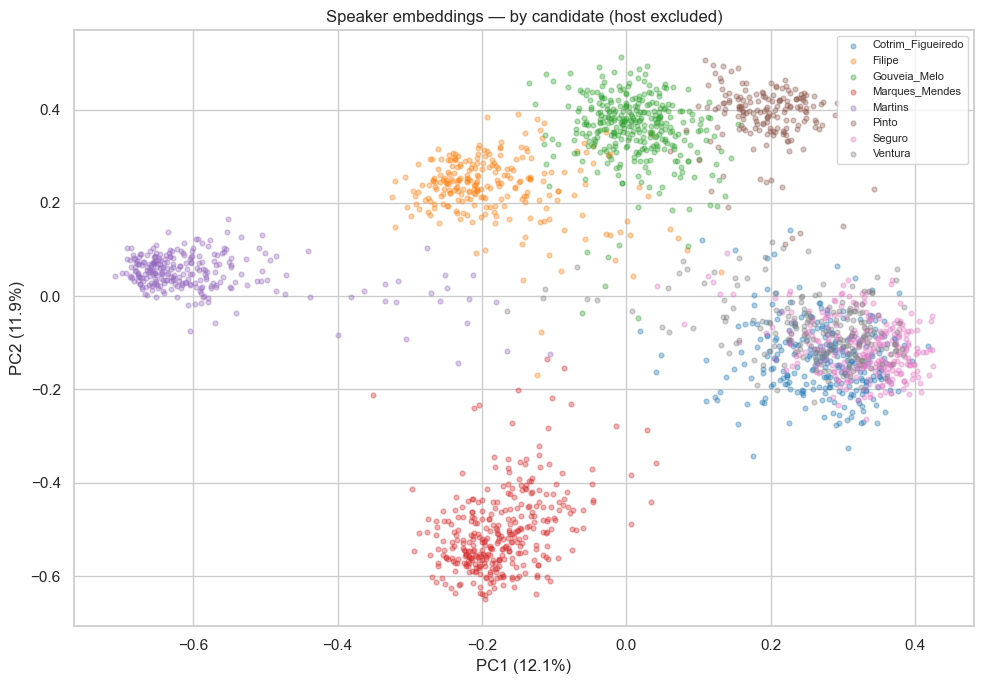

In [27]:
# PCA of speaker embeddings — colored by assigned speaker
# Use only candidate segments (no host) for cleaner visualisation
emb_matrix = np.stack(candidates_data['speak_embeddings'].values)
print('Embedding matrix:', emb_matrix.shape)

pca_emb = PCA(n_components=2, random_state=42)
emb_2d = pca_emb.fit_transform(emb_matrix)
print(f'Explained variance: PC1={pca_emb.explained_variance_ratio_[0]*100:.1f}%  '
      f'PC2={pca_emb.explained_variance_ratio_[1]*100:.1f}%')

fig, ax = plt.subplots(figsize=(10, 7))
for cand in candidates:
    mask = candidates_data['speaker'].values == cand
    ax.scatter(emb_2d[mask, 0], emb_2d[mask, 1],
               label=cand, alpha=0.35, s=12, color=color_map[cand])

ax.set_title('Speaker embeddings — by candidate (host excluded)', fontsize=12)
ax.set_xlabel(f'PC1 ({pca_emb.explained_variance_ratio_[0]*100:.1f}%)')
ax.set_ylabel(f'PC2 ({pca_emb.explained_variance_ratio_[1]*100:.1f}%)')
ax.legend(fontsize=8)
plt.tight_layout()
plt.show()

### 6.1 Candidate consistency across debates in speaker-embedding space

This section measures how stable each candidate's voice representation is across their debates.
It uses the original `512-dim pyannote speaker embeddings` (`WHO is speaking`), not the
`4096-dim EuroLLM transcript embeddings` (`WHAT was said`).

,speaker,debates,segments,total_duration,mean_dist_to_own_centroid,max_dist_to_own_centroid,mean_margin_vs_nearest_other,nearest_other_candidate_global,nearest_other_global_dist,consistency_ratio
4,Martins,7,260,5721.010,0.0287,0.0461,0.7282,Marques_Mendes,0.7552,0.0380
3,Marques_Mendes,7,336,6000.909,0.0361,0.0582,0.5639,Cotrim_Figueiredo,0.5874,0.0615
6,Seguro,7,293,5413.763,0.0366,0.0551,0.4171,Cotrim_Figueiredo,0.4330,0.0846
1,Filipe,7,242,5798.001,0.0370,0.0477,0.6211,Gouveia_Melo,0.6617,0.0560
5,Pinto,7,170,5937.163,0.0378,0.0485,0.5394,Ventura,0.5605,0.0674
7,Ventura,7,195,6806.782,0.0459,0.0571,0.4711,Cotrim_Figueiredo,0.5056,0.0908
2,Gouveia_Melo,7,330,3546.556,0.0463,0.0822,0.5976,Cotrim_Figueiredo,0.6371,0.0727
0,Cotrim_Figueiredo,7,281,5736.281,0.0465,0.0698,0.4054,Seguro,0.4330,0.1073


C:\Users\dinis\AppData\Local\Temp\ipykernel_14428\2614438908.py:99: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\dinis\AppData\Local\Temp\ipykernel_14428\2614438908.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\dinis\AppData\Local\Temp\ipykernel_14428\2614438908.py:134: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


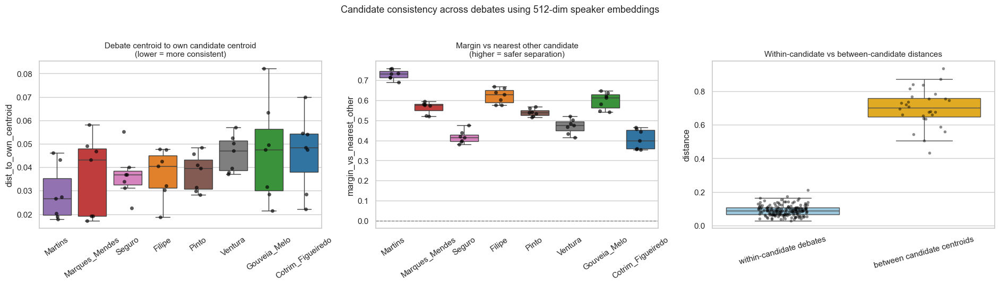

Most atypical candidate-debate centroids (largest distance to own candidate centroid):


,speaker,video,n_segments,total_duration,dist_to_own_centroid,nearest_other_candidate,nearest_other_dist,margin_vs_nearest_other
14,Gouveia_Melo,Cotrim_Figueiredo_vs_Gouveia_Melo_November_20,50,401.609,0.0822,Cotrim_Figueiredo,0.6233,0.5411
2,Cotrim_Figueiredo,Cotrim_Figueiredo_vs_Marques_Mendes_December_7,27,898.728,0.0698,Seguro,0.4274,0.3576
17,Gouveia_Melo,Marques_Mendes_vs_Gouveia_Melo_December_21,42,700.011,0.0633,Cotrim_Figueiredo,0.6433,0.5799
22,Marques_Mendes,Filipe_vs_Marques_Mendes_November_18,56,790.188,0.0582,Seguro,0.6386,0.5804
51,Ventura,Martins_vs_Ventura_November_28,42,1004.685,0.0571,Cotrim_Figueiredo,0.5596,0.5025
43,Seguro,Seguro_vs_Filipe_December_19,38,928.058,0.0551,Cotrim_Figueiredo,0.5295,0.4743
5,Cotrim_Figueiredo,Pinto_vs_Cotrim_Figueiredo_November_24,40,740.764,0.0545,Seguro,0.4996,0.4451
1,Cotrim_Figueiredo,Cotrim_Figueiredo_vs_Gouveia_Melo_November_20,54,801.374,0.0541,Seguro,0.4532,0.3991
52,Ventura,Ventura_vs_Filipe_December_13,26,966.786,0.0525,Cotrim_Figueiredo,0.5355,0.4830
50,Ventura,Gouveia_Melo_vs_Ventura_December_15,30,905.480,0.0503,Cotrim_Figueiredo,0.5262,0.4759


In [28]:
# Candidate consistency across debates in original 512-dim speaker-embedding space
# Lower distance to a candidate's own centroid means a more stable voice profile across debates.

cand_debate_rows = []
for (speaker, video), grp in candidates_data.groupby(['speaker', 'video']):
    E = np.stack(grp['speak_embeddings'].values)
    cand_debate_rows.append({
        'speaker': speaker,
        'video': video,
        'n_segments': len(grp),
        'total_duration': grp['duration'].sum(),
        'centroid': E.mean(axis=0),
    })

cand_debate_centroids = pd.DataFrame(cand_debate_rows)

candidate_centroids = (
    cand_debate_centroids.groupby('speaker')['centroid']
    .apply(lambda s: np.mean(np.stack(s.values), axis=0))
)

per_debate_rows = []
within_pair_rows = []

for speaker, sub in cand_debate_centroids.groupby('speaker'):
    centroids = np.stack(sub['centroid'].values)
    own_centroid = candidate_centroids.loc[speaker]
    d_to_own = cdist(centroids, own_centroid[None, :], metric='cosine').ravel()

    other_candidates = [c for c in candidate_centroids.index if c != speaker]
    other_centroids = np.stack(candidate_centroids.loc[other_candidates].values)
    d_to_others = cdist(centroids, other_centroids, metric='cosine')
    nearest_other_dist = d_to_others.min(axis=1)
    nearest_other_candidate = np.array(other_candidates)[d_to_others.argmin(axis=1)]

    tmp = sub[['speaker', 'video', 'n_segments', 'total_duration']].copy()
    tmp['dist_to_own_centroid'] = d_to_own
    tmp['nearest_other_dist'] = nearest_other_dist
    tmp['nearest_other_candidate'] = nearest_other_candidate
    tmp['margin_vs_nearest_other'] = nearest_other_dist - d_to_own
    per_debate_rows.append(tmp)

    if len(centroids) > 1:
        pw = cdist(centroids, centroids, metric='cosine')
        iu = np.triu_indices_from(pw, k=1)
        for dist in pw[iu]:
            within_pair_rows.append({
                'speaker': speaker,
                'distance': dist,
                'kind': 'within-candidate debates'
            })

consistency_per_debate = pd.concat(per_debate_rows, ignore_index=True)

summary_rows = []
for speaker, sub in consistency_per_debate.groupby('speaker'):
    own_centroid = candidate_centroids.loc[speaker]
    other_candidates = [c for c in candidate_centroids.index if c != speaker]
    other_centroids = np.stack(candidate_centroids.loc[other_candidates].values)
    other_dists = cdist(own_centroid[None, :], other_centroids, metric='cosine').ravel()
    nearest_idx = int(other_dists.argmin())
    nearest_other_global = other_dists[nearest_idx]

    summary_rows.append({
        'speaker': speaker,
        'debates': sub['video'].nunique(),
        'segments': int(sub['n_segments'].sum()),
        'total_duration': sub['total_duration'].sum(),
        'mean_dist_to_own_centroid': sub['dist_to_own_centroid'].mean(),
        'max_dist_to_own_centroid': sub['dist_to_own_centroid'].max(),
        'mean_margin_vs_nearest_other': sub['margin_vs_nearest_other'].mean(),
        'nearest_other_candidate_global': other_candidates[nearest_idx],
        'nearest_other_global_dist': nearest_other_global,
        'consistency_ratio': sub['dist_to_own_centroid'].mean() / nearest_other_global
    })

consistency_summary = pd.DataFrame(summary_rows).sort_values(
    ['mean_dist_to_own_centroid', 'consistency_ratio']
)
display(consistency_summary.round(4))

between_rows = []
candidate_names = list(candidate_centroids.index)
candidate_matrix = np.stack(candidate_centroids.values)
candidate_pw = cdist(candidate_matrix, candidate_matrix, metric='cosine')
iu = np.triu_indices_from(candidate_pw, k=1)
for i, j in zip(*iu):
    between_rows.append({
        'speaker': f'{candidate_names[i]} vs {candidate_names[j]}',
        'distance': candidate_pw[i, j],
        'kind': 'between candidate centroids'
    })

distance_compare = pd.DataFrame(within_pair_rows + between_rows)
order_consistency = consistency_summary['speaker'].tolist()

fig, axes = plt.subplots(1, 3, figsize=(19, 5.2))

sns.boxplot(
    data=consistency_per_debate,
    x='speaker', y='dist_to_own_centroid',
    order=order_consistency,
    palette=[color_map[c] for c in order_consistency],
    ax=axes[0], fliersize=0
)
sns.stripplot(
    data=consistency_per_debate,
    x='speaker', y='dist_to_own_centroid',
    order=order_consistency,
    ax=axes[0], color='black', alpha=0.65, size=5, jitter=0.15
)
axes[0].set_title('Debate centroid to own candidate centroid\n(lower = more consistent)', fontsize=11)
axes[0].set_xlabel('')
axes[0].tick_params(axis='x', rotation=35)

sns.boxplot(
    data=consistency_per_debate,
    x='speaker', y='margin_vs_nearest_other',
    order=order_consistency,
    palette=[color_map[c] for c in order_consistency],
    ax=axes[1], fliersize=0
)
sns.stripplot(
    data=consistency_per_debate,
    x='speaker', y='margin_vs_nearest_other',
    order=order_consistency,
    ax=axes[1], color='black', alpha=0.65, size=5, jitter=0.15
)
axes[1].axhline(0, color='gray', linestyle='--', linewidth=1)
axes[1].set_title('Margin vs nearest other candidate\n(higher = safer separation)', fontsize=11)
axes[1].set_xlabel('')
axes[1].tick_params(axis='x', rotation=35)

sns.boxplot(
    data=distance_compare,
    x='kind', y='distance',
    ax=axes[2], palette=['#8ecae6', '#ffb703'], fliersize=0
)
sns.stripplot(
    data=distance_compare,
    x='kind', y='distance',
    ax=axes[2], color='black', alpha=0.45, size=4, jitter=0.18
)
axes[2].set_title('Within-candidate vs between-candidate distances', fontsize=11)
axes[2].set_xlabel('')
axes[2].tick_params(axis='x', rotation=15)

plt.suptitle('Candidate consistency across debates using 512-dim speaker embeddings', fontsize=13, y=1.03)
plt.tight_layout()
plt.show()

print('Most atypical candidate-debate centroids (largest distance to own candidate centroid):')
display(
    consistency_per_debate[
        ['speaker', 'video', 'n_segments', 'total_duration', 'dist_to_own_centroid',
         'nearest_other_candidate', 'nearest_other_dist', 'margin_vs_nearest_other']
    ]
    .sort_values('dist_to_own_centroid', ascending=False)
    .head(10)
    .round(4)
)


## Part VII — Transcript EDA: quality, lexical patterns, and semantic structure

The `*_speech.pkl` files store Whisper transcripts and 4096-dim EuroLLM embeddings
for each audio segment. These correspond 1:1 with the audio pkl rows.

The transcript section moves from basic description to more interpretive analysis:
1. transcript coverage and segment-level text statistics
2. transcript quality diagnostics
3. lexical patterns (`word clouds`, `bigrams`, `lexical richness`)
4. semantic embedding analysis and candidate/topic similarity

In [29]:
speech_files = sorted([
    f for f in os.listdir(FEATURES_DIR)
    if f.endswith('_speech.pkl')
])

speech_dfs = []
for f in speech_files:
    df = pd.read_pickle(os.path.join(FEATURES_DIR, f))
    df['video'] = f.replace('_speech.pkl', '')
    speech_dfs.append(df)

data_speech = pd.concat(speech_dfs, ignore_index=True)
print(f'Shape: {data_speech.shape}')
print(f'Columns: {list(data_speech.columns)}')
print()
print('Missing values:')
print(data_speech.isnull().sum())

Shape: (1407, 5)
Columns: ['timestamp', 'duration', 'transcript', 'text_embedding', 'video']

Missing values:
timestamp         0
duration          0
transcript        0
text_embedding    0
video             0
dtype: int64


In [30]:
# Sample transcripts
print('=== Sample transcripts ===')
for i in [0, 5, 10, 20]:
    row = data_speech.iloc[i]
    print(f'\n[{row["video"]} | segment {i}]')
    print(row['transcript'][:300])

=== Sample transcripts ===

[Cotrim_Figueiredo_vs_Filipe_November_30 | segment 0]
 Boa noite. A caminho das presidenciais, esta noite, o debate é entre João, com Trinfigaredo e Antonio Felipe, bem-vindos, o sorteio de toque começa. Antonio Felipe, e termina com Trinfigaredo. Antonio Felipe, como sempre nós abrimos com um tema da atualidade, começamos por que os português esperam 

[Cotrim_Figueiredo_vs_Filipe_November_30 | segment 5]
 E o antefeiço que o PCP do Ojão mudou. O PCP queria fazer um referente para sair do Euro. Sabe que esse referente não é possível, costicionalmente, o que se defendeu na altura aqui, ou que ele não gostou aqui com partidos, o defendi foi que a retificação para o Portugal dos tratados relativos ao Eu

[Cotrim_Figueiredo_vs_Filipe_November_30 | segment 10]
 Pouando, o SNS são os funcionamal, são os privados que mais ganham. Portanto, eu digo que é irresponsável. Não atacar a este problema na base. E seja qual for a solução, eu, enquanto precisa de república,

Word count per segment:
count    1407.00
mean      128.26
std        86.08
min        18.00
25%        75.00
50%       100.00
75%       147.00
max       712.00
Name: word_count, dtype: float64

Words per second (proxy for transcription quality):
count    1407.000
mean        3.110
std         0.580
min         0.694
25%         2.691
50%         3.064
75%         3.507
max         5.337
Name: words_per_sec, dtype: float64


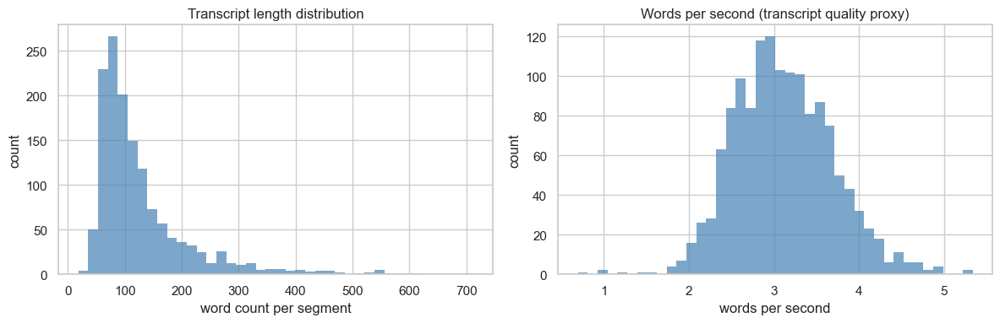

In [31]:
# Transcript length distribution
data_speech['word_count'] = data_speech['transcript'].apply(
    lambda t: len(str(t).split()) if pd.notnull(t) else 0
)
data_speech['words_per_sec'] = data_speech['word_count'] / data_speech['duration']

print('Word count per segment:')
print(data_speech['word_count'].describe().round(2))
print()
print('Words per second (proxy for transcription quality):')
print(data_speech['words_per_sec'].describe().round(3))

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(data_speech['word_count'], bins=40, color='steelblue', alpha=0.7, edgecolor='none')
axes[0].set_xlabel('word count per segment')
axes[0].set_ylabel('count')
axes[0].set_title('Transcript length distribution')

axes[1].hist(data_speech['words_per_sec'].clip(0, 8), bins=40, color='steelblue', alpha=0.7, edgecolor='none')
axes[1].set_xlabel('words per second')
axes[1].set_ylabel('count')
axes[1].set_title('Words per second (transcript quality proxy)')

plt.tight_layout()
plt.show()

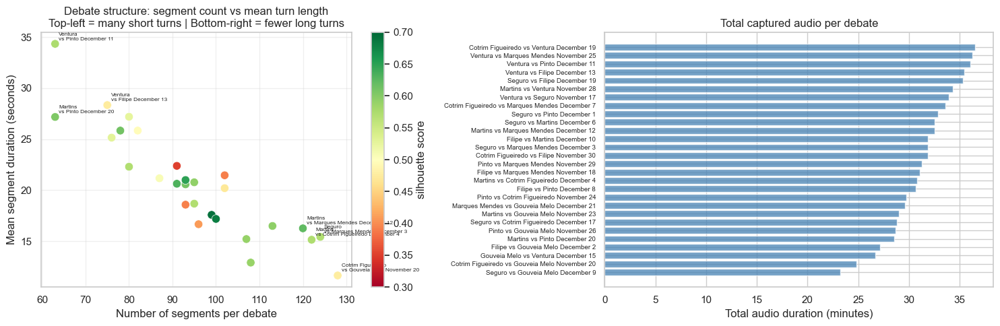

Debate duration summary:
                                         video  n_segments  mean_duration  total_duration  sil_score
                  Ventura_vs_Pinto_December_11          63          34.34         2163.58       0.57
                 Ventura_vs_Filipe_December_13          75          28.34         2125.64       0.48
         Ventura_vs_Marques_Mendes_November_25          80          27.20         2175.66       0.53
                  Martins_vs_Pinto_December_20          63          27.18         1712.25       0.60
                  Seguro_vs_Filipe_December_19          82          25.84         2119.25       0.50
Cotrim_Figueiredo_vs_Marques_Mendes_December_7          78          25.84         2015.72       0.61
       Cotrim_Figueiredo_vs_Filipe_November_30          76          25.15         1911.55       0.53
                 Ventura_vs_Seguro_November_17          91          22.38         2037.01       0.35
        Pinto_vs_Cotrim_Figueiredo_November_24          80        

In [32]:
# ── CELL: Segment duration statistics per debate ──────────────────────────────
# Label-free. For each debate: how many segments, how long on average?
# Scatter of n_segments vs mean_duration reveals debates with many short turns
# (interrupted/dynamic) vs few long turns (monologue-heavy).

import matplotlib.cm as cm

debate_stats = []
for video_name in debate_videos:
    sub = data[data['video'] == video_name]
    debate_stats.append({
        'video':         video_name,
        'n_segments':    len(sub),
        'mean_duration': sub['duration'].mean(),
        'median_duration': sub['duration'].median(),
        'total_duration':  sub['duration'].sum(),
        'sil_score':     quality_scores.get(video_name, np.nan)
    })

stats_df = pd.DataFrame(debate_stats)

# Color points by silhouette score so you can see if messy debates
# (low sil) cluster in a particular region of the scatter
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

sc = axes[0].scatter(
    stats_df['n_segments'], stats_df['mean_duration'],
    c=stats_df['sil_score'], cmap='RdYlGn',
    vmin=0.3, vmax=0.7, s=80, edgecolors='white', linewidth=0.5, zorder=3
)
plt.colorbar(sc, ax=axes[0], label='silhouette score')

# Annotate a few notable debates
for _, row in stats_df.iterrows():
    if row['n_segments'] > 115 or row['mean_duration'] > 28 or row['n_segments'] < 68:
        axes[0].annotate(
            row['video'].replace('_', ' ').replace(' vs ', '\nvs '),
            (row['n_segments'], row['mean_duration']),
            fontsize=6, xytext=(4, 4), textcoords='offset points'
        )

axes[0].set_xlabel('Number of segments per debate')
axes[0].set_ylabel('Mean segment duration (seconds)')
axes[0].set_title('Debate structure: segment count vs mean turn length\n'
                  'Top-left = many short turns | Bottom-right = fewer long turns')
axes[0].grid(alpha=0.3)

# Bar chart of total debate duration
stats_sorted = stats_df.sort_values('total_duration', ascending=True)
axes[1].barh(
    [v.replace('_', ' ') for v in stats_sorted['video']],
    stats_sorted['total_duration'] / 60,
    color='steelblue', alpha=0.75, edgecolor='white'
)
axes[1].set_xlabel('Total audio duration (minutes)')
axes[1].set_title('Total captured audio per debate')
axes[1].tick_params(axis='y', labelsize=7)

plt.tight_layout()
plt.show()

print('Debate duration summary:')
print(stats_df[['video', 'n_segments', 'mean_duration', 'total_duration', 'sil_score']]
      .sort_values('mean_duration', ascending=False)
      .round(2)
      .to_string(index=False))

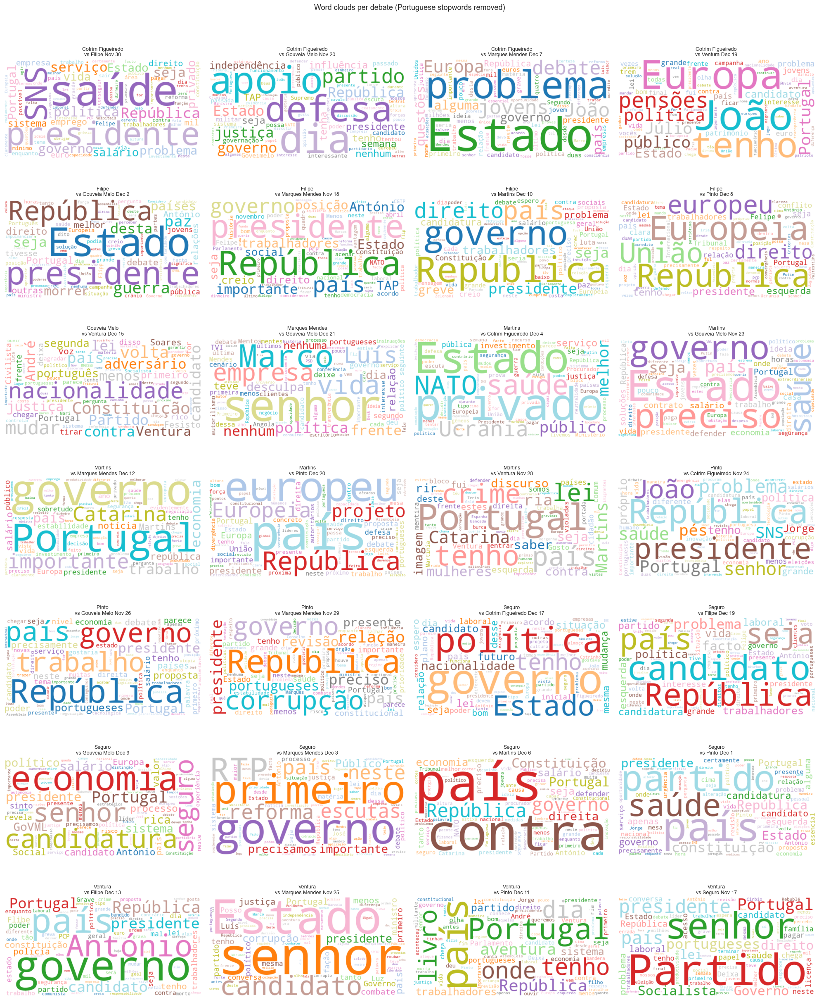

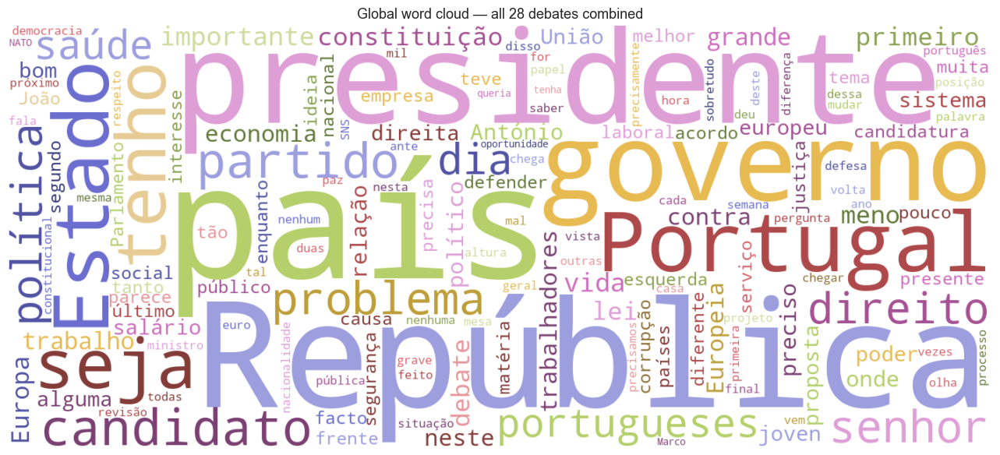

In [33]:
# ── CELL: Word clouds per debate + global word cloud ─────────────────────────
# Uses the speech pkl transcripts. Debate videos only.
# Portuguese stopwords are filtered so content words dominate.

from wordcloud import WordCloud
import math

# Portuguese stopwords — common function words that add no content
PT_STOPWORDS = {
    # Original set
    'de', 'a', 'o', 'que', 'e', 'do', 'da', 'em', 'um', 'para', 'uma',
    'com', 'não', 'por', 'mais', 'as', 'dos', 'como', 'mas', 'foi', 'ao',
    'ele', 'das', 'tem', 'à', 'seu', 'sua', 'ou', 'ser', 'quando', 'muito',
    'há', 'nos', 'já', 'está', 'eu', 'também', 'só', 'pelo', 'pela', 'até',
    'isso', 'ela', 'entre', 'era', 'depois', 'sem', 'mesmo', 'aos', 'seus',
    'quem', 'nas', 'me', 'esse', 'eles', 'estão', 'você', 'tinha', 'foram',
    'essa', 'num', 'nem', 'suas', 'meu', 'às', 'minha', 'têm', 'numa',
    'pelos', 'pelas', 'qual', 'nós', 'lhe', 'deles', 'essas', 'esses',
    'pois', 'se', 'si', 'nessa', 'nesse', 'todo', 'toda', 'tudo', 'isto',
    'aqui', 'aquele', 'aquela', 'vos', 'lhes', 'cujo', 'cuja', 'nele',
    'dele', 'delas', 'nela', 'nos', 'na', 'no', 'ter', 'this', 'the',
    'que', 'são', 'este', 'esta', 'boa', 'noite', 'então', 'assim',
    'porque', 'temos', 'sobre', 'aqui', 'agora', 'bem', 'vai', 'pode',
    'vou', 'acho', 'anos', 'isso', 'isto', 'dizer', 'fazer', 'haver',
    # ── New additions ──────────────────────────────────────────────────────
    # Filler / discourse markers
    'coisa', 'coisas', 'aquilo', 'portanto', 'aliás', 'claro', 'sim',
    'nada', 'nunca', 'sempre', 'ainda', 'também', 'depois', 'hoje',
    # Verb conjugations
    'estou', 'estamos', 'estava', 'vamos', 'vão', 'sou', 'sabe', 'sei',
    'quer', 'quero', 'querem', 'podemos', 'deve', 'falar', 'faz', 'fez',
    'disse', 'diz', 'ver', 'dar', 'têm', 'temos', 'fazer', 'dizer',
    'estar', 'sendo', 'tendo', 'sido',
    # Generic nouns that carry no discriminating content
    'pessoa', 'pessoas', 'gente', 'lado', 'parte', 'forma', 'vez', 'caso',
    'ponto', 'sentido', 'tempo', 'momento', 'exemplo', 'questão', 'verdade',
    # Pronouns / determiners not already covered
    'nosso', 'nossa', 'todos', 'outro', 'outros', 'outra', 'alguém',
    'ninguém', 'qualquer', 'mim', 'dois',
}

def make_wordcloud(text, title, ax):
    wc = WordCloud(
        width=600, height=300,
        background_color='white',
        stopwords=PT_STOPWORDS,
        max_words=80,
        colormap='tab20',
        min_word_length=3,
        collocations=False
    ).generate(text)
    ax.imshow(wc, interpolation='bilinear')
    ax.set_title(title, fontsize=9)
    ax.axis('off')

# Filter speech data to debates only
speech_debates = data_speech[data_speech['video'].isin(debate_videos)].copy()

# ── Per-debate word clouds ────────────────────────────────────────────────────
n = len(debate_videos)
ncols = 4
nrows = math.ceil(n / ncols)

fig, axes = plt.subplots(nrows, ncols, figsize=(20, nrows * 3.5))
axes = axes.flatten()

for i, video_name in enumerate(sorted(debate_videos)):
    sub = speech_debates[speech_debates['video'] == video_name]
    full_text = ' '.join(sub['transcript'].dropna().astype(str).tolist())
    title = video_name.replace('_', ' ').replace(' vs ', '\nvs ').replace(
        'November', 'Nov').replace('December', 'Dec')
    make_wordcloud(full_text, title, axes[i])

# Hide unused axes
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle('Word clouds per debate (Portuguese stopwords removed)', fontsize=13, y=1.01)
plt.tight_layout()
plt.show()

# ── Global word cloud — all debates combined ──────────────────────────────────
all_text = ' '.join(speech_debates['transcript'].dropna().astype(str).tolist())

fig, ax = plt.subplots(figsize=(14, 6))
wc_global = WordCloud(
    width=1400, height=600,
    background_color='white',
    stopwords=PT_STOPWORDS,
    max_words=150,
    colormap='tab20b',
    min_word_length=3,
    collocations=False
).generate(all_text)

ax.imshow(wc_global, interpolation='bilinear')
ax.axis('off')
ax.set_title('Global word cloud — all 28 debates combined', fontsize=13)
plt.tight_layout()
plt.show()

In [34]:
# Merge speaker labels from audio data into speech data
# Merge key: (video, timestamp) — rows correspond to same segments
ts_col = 'timestamp' if 'timestamp' in data_speech.columns else 'time stamp'
audio_ts_col = 'time stamp'

speech_labeled = data_speech.merge(
    data[['video', audio_ts_col, 'speaker', 'party']].rename(columns={audio_ts_col: ts_col}),
    on=['video', ts_col],
    how='left'
)
print(f'Merged shape: {speech_labeled.shape}')
print('Speaker counts after merge:')
print(speech_labeled['speaker'].value_counts())

Merged shape: (1407, 9)
Speaker counts after merge:
speaker
host                 120
Marques_Mendes       110
Pinto                108
Martins              101
Filipe                98
Ventura               95
Seguro                94
Cotrim_Figueiredo     92
Gouveia_Melo          25
Name: count, dtype: int64


Transcript quality summary:
segments                     1407.00
replacement_char_segments      12.00
non_latin_segments             20.00
low_alpha_ratio_segments        0.00
words_per_sec_outliers         30.00
suspicious_segments_total      55.00
suspicious_share_pct            3.91

Words/sec outlier thresholds: < 1.93 or > 4.58


,segments,suspicious_segments,suspicious_share,mean_alpha_ratio,mean_words_per_sec,suspicious_share_pct
video,,,,,,
Ventura_vs_Pinto_December_11,35,6,0.171,0.784,3.864,17.143
Telejornal_RTP_Jan_6,25,4,0.160,0.797,2.587,16.000
Cotrim_Figueiredo_vs_Filipe_November_30,33,5,0.152,0.793,3.366,15.152
Gouveia_Melo_vs_Ventura_December_15,21,3,0.143,0.779,3.946,14.286
Ventura_vs_Marques_Mendes_November_25,32,3,0.094,0.783,3.457,9.375
Filipe_vs_Martins_December_10,36,3,0.083,0.794,3.204,8.333
Cotrim_Figueiredo_vs_Ventura_December_19,37,3,0.081,0.780,3.766,8.108
Martins_vs_Gouveia_Melo_November_23,28,2,0.071,0.795,3.336,7.143
Ventura_vs_Filipe_December_13,32,2,0.062,0.786,3.743,6.250


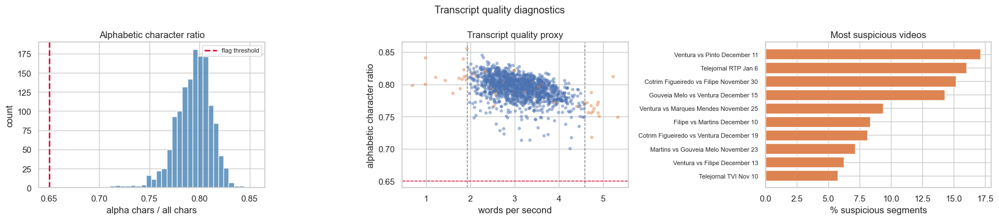

Examples of suspicious transcripts:


,video,duration,words_per_sec,alpha_ratio,transcript_str
1,Cotrim_Figueiredo_vs_Filipe_November_30,44.972,3.201992,0.795799,"O da Itaí�� e Pegueiro,しく cookiecutei depois,..."
16,Cotrim_Figueiredo_vs_Filipe_November_30,58.944,3.036781,0.795741,"mas essa pessoa não tem capacidade económica,..."
25,Cotrim_Figueiredo_vs_Filipe_November_30,31.742,3.528448,0.770898,"porque tem sido prática da CGTP, alinhasse-se..."
27,Cotrim_Figueiredo_vs_Filipe_November_30,36.399,3.544053,0.783934,"Mas eu estou tão preocupado, os caras mais pr..."
28,Cotrim_Figueiredo_vs_Filipe_November_30,34.374,2.530983,0.815217,Os senhores dos assiuristas das empresas. Os ...
48,Cotrim_Figueiredo_vs_Gouveia_Melo_November_20,29.632,5.230832,0.811957,que os liberais vão defender o papel do Estad...
70,Cotrim_Figueiredo_vs_Marques_Mendes_December_7,47.773,3.307307,0.776207,Mas o presidente da república que se prece pr...
90,Cotrim_Figueiredo_vs_Ventura_December_19,20.048,4.738627,0.787109,É um assunto que eu acho que é relevante tamb...


In [35]:
# ── CELL: Transcript quality diagnostics ────────────────────────────────────
import re
import unicodedata

def clean_transcript_for_eda(text):
    text = str(text).lower()
    text = re.sub(r'\s+', ' ', text).strip()
    return text

def tokenize_transcript(text, stopwords=None, min_len=3):
    stopwords = set() if stopwords is None else set(stopwords)
    text = clean_transcript_for_eda(text)
    tokens = re.findall(r"[a-zà-ÿ]+(?:-[a-zà-ÿ]+)?", text, flags=re.IGNORECASE)
    return [t for t in tokens if len(t) >= min_len and t not in stopwords]

def has_non_latin_script(text):
    for ch in str(text):
        name = unicodedata.name(ch, '')
        if any(tag in name for tag in ('CYRILLIC', 'HIRAGANA', 'KATAKANA', 'CJK UNIFIED')):
            return True
    return False

speech_quality = data_speech.copy()
speech_quality['transcript_str'] = speech_quality['transcript'].astype(str)
speech_quality['clean_transcript'] = speech_quality['transcript_str'].apply(clean_transcript_for_eda)
speech_quality['char_count'] = speech_quality['transcript_str'].str.len()
speech_quality['alpha_chars'] = speech_quality['transcript_str'].apply(
    lambda t: sum(ch.isalpha() for ch in str(t))
)
speech_quality['alpha_ratio'] = speech_quality['alpha_chars'] / speech_quality['char_count'].clip(lower=1)
speech_quality['digit_ratio'] = speech_quality['transcript_str'].apply(
    lambda t: sum(ch.isdigit() for ch in str(t)) / max(len(str(t)), 1)
)
speech_quality['replacement_char_count'] = speech_quality['transcript_str'].str.count('�')
speech_quality['has_replacement_char'] = speech_quality['replacement_char_count'] > 0
speech_quality['has_non_latin_script'] = speech_quality['transcript_str'].apply(has_non_latin_script)

wps_low, wps_high = speech_quality['words_per_sec'].quantile([0.01, 0.99])
speech_quality['wps_outlier'] = (
    (speech_quality['words_per_sec'] < wps_low) |
    (speech_quality['words_per_sec'] > wps_high)
)
speech_quality['low_alpha_ratio'] = speech_quality['alpha_ratio'] < 0.65
speech_quality['suspicious_transcript'] = (
    speech_quality['has_replacement_char'] |
    speech_quality['has_non_latin_script'] |
    speech_quality['wps_outlier'] |
    speech_quality['low_alpha_ratio']
)

quality_summary = pd.Series({
    'segments': len(speech_quality),
    'replacement_char_segments': int(speech_quality['has_replacement_char'].sum()),
    'non_latin_segments': int(speech_quality['has_non_latin_script'].sum()),
    'low_alpha_ratio_segments': int(speech_quality['low_alpha_ratio'].sum()),
    'words_per_sec_outliers': int(speech_quality['wps_outlier'].sum()),
    'suspicious_segments_total': int(speech_quality['suspicious_transcript'].sum()),
    'suspicious_share_pct': round(100 * speech_quality['suspicious_transcript'].mean(), 2),
})
print('Transcript quality summary:')
print(quality_summary.to_string())
print()
print(f'Words/sec outlier thresholds: < {wps_low:.2f} or > {wps_high:.2f}')

video_quality = (
    speech_quality.groupby('video')
    .agg(
        segments=('transcript_str', 'size'),
        suspicious_segments=('suspicious_transcript', 'sum'),
        suspicious_share=('suspicious_transcript', 'mean'),
        mean_alpha_ratio=('alpha_ratio', 'mean'),
        mean_words_per_sec=('words_per_sec', 'mean')
    )
    .sort_values(['suspicious_share', 'suspicious_segments'], ascending=False)
)
video_quality['suspicious_share_pct'] = 100 * video_quality['suspicious_share']
display(video_quality.head(12).round(3))

fig, axes = plt.subplots(1, 3, figsize=(18, 4))

axes[0].hist(speech_quality['alpha_ratio'], bins=30, color='steelblue', alpha=0.8, edgecolor='white')
axes[0].axvline(0.65, color='crimson', linestyle='--', linewidth=2, label='flag threshold')
axes[0].set_title('Alphabetic character ratio')
axes[0].set_xlabel('alpha chars / all chars')
axes[0].set_ylabel('count')
axes[0].legend(fontsize=8)

axes[1].scatter(
    speech_quality['words_per_sec'],
    speech_quality['alpha_ratio'],
    c=speech_quality['suspicious_transcript'].map({False: '#4c72b0', True: '#dd8452'}),
    alpha=0.5,
    s=18,
    edgecolors='none'
)
axes[1].axvline(wps_low, color='gray', linestyle='--', linewidth=1)
axes[1].axvline(wps_high, color='gray', linestyle='--', linewidth=1)
axes[1].axhline(0.65, color='crimson', linestyle='--', linewidth=1)
axes[1].set_title('Transcript quality proxy')
axes[1].set_xlabel('words per second')
axes[1].set_ylabel('alphabetic character ratio')

top_videos = video_quality.head(10).sort_values('suspicious_share_pct')
axes[2].barh(
    [v.replace('_', ' ') for v in top_videos.index],
    top_videos['suspicious_share_pct'],
    color='#dd8452',
    edgecolor='white'
)
axes[2].set_title('Most suspicious videos')
axes[2].set_xlabel('% suspicious segments')
axes[2].tick_params(axis='y', labelsize=8)

plt.suptitle('Transcript quality diagnostics', fontsize=13)
plt.tight_layout()
plt.show()

print('Examples of suspicious transcripts:')
display(
    speech_quality.loc[
        speech_quality['suspicious_transcript'],
        ['video', 'duration', 'words_per_sec', 'alpha_ratio', 'transcript_str']
    ]
    .head(8)
)


Token totals used for bigram counts:
Ventura              8100
Pinto                7295
Filipe               5353
Martins              5190
Cotrim_Figueiredo    4916
Marques_Mendes       4351
Seguro               4243
Gouveia_Melo          796



,speaker,bigram,count,per_1000_tokens
0,Cotrim_Figueiredo,júlio júlio,11,2.24
1,Cotrim_Figueiredo,união europeia,10,2.03
2,Cotrim_Figueiredo,presente república,8,1.63
3,Cotrim_Figueiredo,pés pés,7,1.42
4,Cotrim_Figueiredo,presidente república,6,1.22
...,...,...,...,...
59,Ventura,lei laboral,13,1.60
60,Ventura,antónio flibe,12,1.48
61,Ventura,bloco esquerda,10,1.23
62,Ventura,primeiro ministro,9,1.11


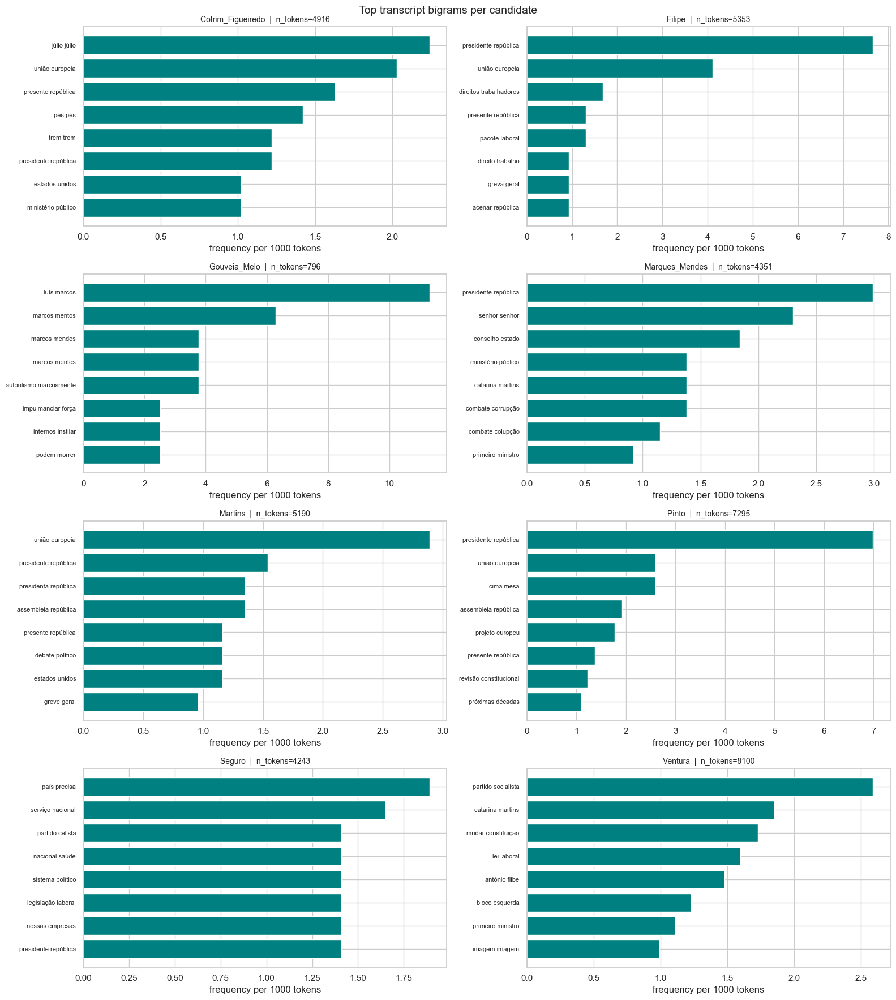

In [36]:
# ── CELL: Top bigrams per candidate ─────────────────────────────────────────
from collections import Counter

candidate_text = speech_labeled[
    speech_labeled['video'].isin(debate_videos) &
    speech_labeled['speaker'].notna() &
    ~speech_labeled['speaker'].isin(['host', 'unknown'])
].copy()

candidate_text['tokens_eda'] = candidate_text['transcript'].apply(
    lambda t: tokenize_transcript(t, stopwords=PT_STOPWORDS, min_len=3)
)

def top_bigrams_for_group(token_lists, top_n=10):
    counter = Counter()
    total_tokens = 0
    for tokens in token_lists:
        total_tokens += len(tokens)
        counter.update(zip(tokens, tokens[1:]))
    rows = []
    for bg, count in counter.most_common(top_n):
        rows.append({
            'bigram': ' '.join(bg),
            'count': count,
            'per_1000_tokens': round(1000 * count / max(total_tokens, 1), 2)
        })
    return pd.DataFrame(rows), total_tokens

bigram_tables = {}
bigram_rows = []
token_totals = {}

for speaker, sub in candidate_text.groupby('speaker'):
    tbl, total_tokens = top_bigrams_for_group(sub['tokens_eda'], top_n=8)
    bigram_tables[speaker] = tbl
    token_totals[speaker] = total_tokens
    if not tbl.empty:
        tmp = tbl.copy()
        tmp.insert(0, 'speaker', speaker)
        bigram_rows.append(tmp)

bigram_df = pd.concat(bigram_rows, ignore_index=True)
print('Token totals used for bigram counts:')
print(pd.Series(token_totals).sort_values(ascending=False).to_string())
print()
display(bigram_df)

speakers_sorted = sorted(bigram_tables)
fig, axes = plt.subplots(4, 2, figsize=(16, 18))
axes = axes.flatten()

for ax, speaker in zip(axes, speakers_sorted):
    tbl = bigram_tables[speaker].sort_values('per_1000_tokens', ascending=True)
    ax.barh(tbl['bigram'], tbl['per_1000_tokens'], color='teal', edgecolor='white')
    ax.set_title(f'{speaker}  |  n_tokens={token_totals[speaker]}', fontsize=10)
    ax.set_xlabel('frequency per 1000 tokens')
    ax.tick_params(axis='y', labelsize=8)

for ax in axes[len(speakers_sorted):]:
    ax.axis('off')

plt.suptitle('Top transcript bigrams per candidate', fontsize=14)
plt.tight_layout()
plt.show()


,speaker,segments,tokens,unique_tokens,type_token_ratio,root_ttr,repetition_ratio,hapax_ratio,mean_words_per_segment
0,Cotrim_Figueiredo,92,4916,2694,0.5480,38.4230,0.4520,0.3836,140.2065
1,Ventura,95,8100,3305,0.4080,36.7222,0.5920,0.2567,244.1474
2,Filipe,98,5353,2594,0.4846,35.4545,0.5154,0.3308,142.1633
3,Pinto,108,7295,2945,0.4037,34.4804,0.5963,0.2558,173.4352
4,Martins,101,5190,2274,0.4382,31.5651,0.5618,0.2748,132.4455
5,Marques_Mendes,110,4351,2061,0.4737,31.2452,0.5263,0.3052,103.6000
6,Seguro,94,4243,2020,0.4761,31.0109,0.5239,0.3125,113.6170
7,Gouveia_Melo,25,796,566,0.7111,20.0613,0.2889,0.5540,83.3600


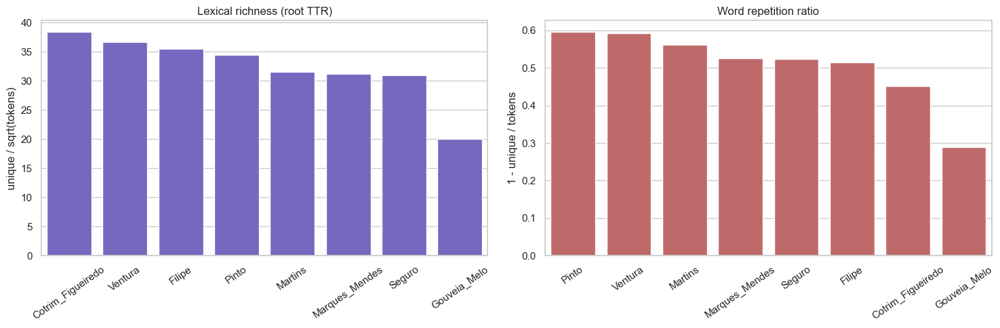

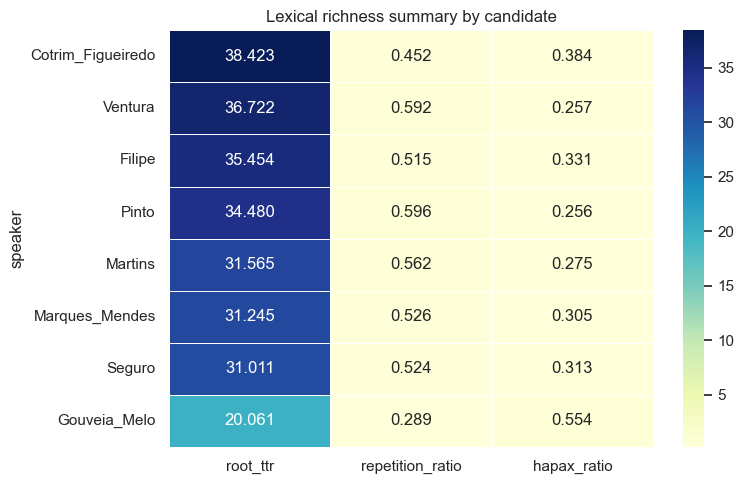

Note: candidate comparisons depend on transcript coverage after the speaker merge.


In [37]:
# ── CELL: Lexical richness per candidate ────────────────────────────────────
lexical_rows = []

for speaker, sub in candidate_text.groupby('speaker'):
    tokens = [tok for toks in sub['tokens_eda'] for tok in toks]
    counts = Counter(tokens)
    total_tokens = len(tokens)
    unique_tokens = len(counts)
    hapax_count = sum(1 for c in counts.values() if c == 1)

    lexical_rows.append({
        'speaker': speaker,
        'segments': len(sub),
        'tokens': total_tokens,
        'unique_tokens': unique_tokens,
        'type_token_ratio': unique_tokens / max(total_tokens, 1),
        'root_ttr': unique_tokens / np.sqrt(max(total_tokens, 1)),
        'repetition_ratio': 1 - (unique_tokens / max(total_tokens, 1)),
        'hapax_ratio': hapax_count / max(total_tokens, 1),
        'mean_words_per_segment': sub['word_count'].mean()
    })

lexical_df = (
    pd.DataFrame(lexical_rows)
    .sort_values('root_ttr', ascending=False)
    .reset_index(drop=True)
)
display(lexical_df.round(4))

lexical_plot = lexical_df.set_index('speaker')[['root_ttr', 'repetition_ratio', 'hapax_ratio']]

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

sns.barplot(
    data=lexical_df,
    x='speaker',
    y='root_ttr',
    order=lexical_df.sort_values('root_ttr', ascending=False)['speaker'],
    color='slateblue',
    ax=axes[0]
)
axes[0].set_title('Lexical richness (root TTR)')
axes[0].set_xlabel('')
axes[0].set_ylabel('unique / sqrt(tokens)')
axes[0].tick_params(axis='x', rotation=35)

sns.barplot(
    data=lexical_df,
    x='speaker',
    y='repetition_ratio',
    order=lexical_df.sort_values('repetition_ratio', ascending=False)['speaker'],
    color='indianred',
    ax=axes[1]
)
axes[1].set_title('Word repetition ratio')
axes[1].set_xlabel('')
axes[1].set_ylabel('1 - unique / tokens')
axes[1].tick_params(axis='x', rotation=35)

plt.tight_layout()
plt.show()

fig, ax = plt.subplots(figsize=(8, 5))
sns.heatmap(
    lexical_plot,
    annot=True,
    fmt='.3f',
    cmap='YlGnBu',
    linewidths=0.5,
    ax=ax
)
ax.set_title('Lexical richness summary by candidate')
plt.tight_layout()
plt.show()

print('Note: candidate comparisons depend on transcript coverage after the speaker merge.')


Embedding columns found: ['text_embedding']
Transcript embedding matrix: (1407, 4096)
Explained variance: PC1=17.2%  PC2=10.3%


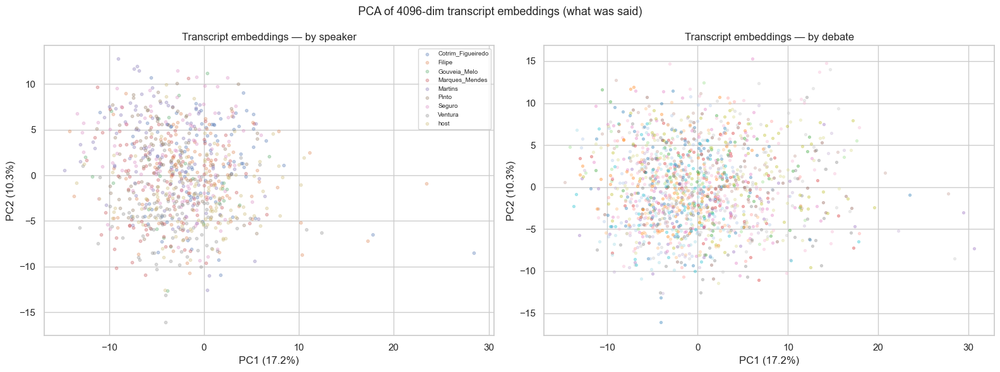

In [38]:
# PCA of transcript embeddings — colored by speaker
# Shows whether candidates talk about different topics
embed_col = [c for c in data_speech.columns if 'embed' in c.lower()]
print('Embedding columns found:', embed_col)

if embed_col:
    # Parse if stored as string
    sample = data_speech[embed_col[0]].iloc[0]
    if isinstance(sample, str):
        data_speech[embed_col[0]] = data_speech[embed_col[0]].apply(
            lambda s: np.fromstring(s.strip('[]'), sep=' ') if isinstance(s, str) else s
        )
        speech_labeled[embed_col[0]] = data_speech[embed_col[0]]

    t_embeddings = np.stack(data_speech[embed_col[0]].values)
    print(f'Transcript embedding matrix: {t_embeddings.shape}')

    pca_t = PCA(n_components=2, random_state=42)
    t_2d = pca_t.fit_transform(t_embeddings)
    print(f'Explained variance: PC1={pca_t.explained_variance_ratio_[0]*100:.1f}%  '
          f'PC2={pca_t.explained_variance_ratio_[1]*100:.1f}%')

    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    # By speaker
    spk_col = speech_labeled['speaker'] if 'speaker' in speech_labeled.columns else None
    if spk_col is not None:
        for spk in sorted(spk_col.dropna().unique()):
            mask = (spk_col == spk).values
            axes[0].scatter(t_2d[mask, 0], t_2d[mask, 1],
                            label=spk, alpha=0.3, s=10)
        axes[0].legend(fontsize=7)
    else:
        axes[0].scatter(t_2d[:, 0], t_2d[:, 1], alpha=0.3, s=8, color='steelblue')

    axes[0].set_title('Transcript embeddings — by speaker')
    axes[0].set_xlabel(f'PC1 ({pca_t.explained_variance_ratio_[0]*100:.1f}%)')
    axes[0].set_ylabel(f'PC2 ({pca_t.explained_variance_ratio_[1]*100:.1f}%)')

    # By debate
    videos = data_speech['video'].unique()
    palette_v = sns.color_palette('tab20', len(videos))
    for i, vid in enumerate(videos):
        mask = (data_speech['video'] == vid).values
        axes[1].scatter(t_2d[mask, 0], t_2d[mask, 1],
                        alpha=0.3, s=8, color=palette_v[i])

    axes[1].set_title('Transcript embeddings — by debate')
    axes[1].set_xlabel(f'PC1 ({pca_t.explained_variance_ratio_[0]*100:.1f}%)')
    axes[1].set_ylabel(f'PC2 ({pca_t.explained_variance_ratio_[1]*100:.1f}%)')

    plt.suptitle('PCA of 4096-dim transcript embeddings (what was said)', fontsize=13)
    plt.tight_layout()
    plt.show()

In [39]:
# ── Transcript embedding comparison — do candidates talk about similar things? ─
#
# The text_embedding (4096-dim EuroLLM) encodes WHAT was said semantically.
# The speak_embedding (512-dim pyannote) encodes WHO is speaking.
# These are completely independent — this cell uses only text_embedding.
#
# We use the speaker labels from k=3 matching, with the explicit caveat that
# Tier 2 debates (Ventura-involved) have less reliable assignments.
#
# Merge path: speech data has a subset of audio timestamps.
# speech['timestamp'] == audio['time stamp'] for every row → clean left-join.

# ── Step 1: merge speaker labels from audio into speech ───────────────────────
speech_debates = data_speech[data_speech['video'].isin(debate_videos)].copy()

speech_labeled = speech_debates.merge(
    data[['video', 'time stamp', 'speaker', 'party', 'cluster_k3']]
        .rename(columns={'time stamp': 'timestamp'}),
    on=['video', 'timestamp'],
    how='left'
)

print(f'Speech segments: {len(speech_labeled)}')
print(f'Successfully labeled: {speech_labeled["speaker"].notna().sum()}')
print()
print('Segments per speaker (speech data):')
print(speech_labeled['speaker'].value_counts().to_string())

Speech segments: 843
Successfully labeled: 843

Segments per speaker (speech data):
speaker
host                 120
Marques_Mendes       110
Pinto                108
Martins              101
Filipe                98
Ventura               95
Seguro                94
Cotrim_Figueiredo     92
Gouveia_Melo          25


In [40]:
# ── Step 2: parse text embeddings and reduce to 2D ────────────────────────────
# In the pkl-loaded notebook, text_embedding is already a numpy array.
# If it arrives as a string (CSV fallback), parse it.

emb_col = 'text_embedding'

def parse_text_embedding(x):
    if isinstance(x, np.ndarray):
        return x
    # Remove numpy print truncation if present — requires pkl source
    if '...' in str(x):
        raise ValueError(
            'text_embedding is truncated (CSV export artifact). '
            'Load data_speech from the pkl files, not from CSV.'
        )
    return np.fromstring(str(x).strip('[]'), sep=' ')

speech_labeled[emb_col] = speech_labeled[emb_col].apply(parse_text_embedding)

T = np.stack(speech_labeled[emb_col].values)  # (n_segments, 4096)
print(f'Transcript embedding matrix: {T.shape}')

# PCA: 4096 → 50 first (fast), then use those 50 for t-SNE if desired
pca_t = PCA(n_components=50, random_state=42)
T_50 = pca_t.fit_transform(T)
explained_50 = pca_t.explained_variance_ratio_.sum() * 100

pca_2d = PCA(n_components=2, random_state=42)
T_2d = pca_2d.fit_transform(T_50)
var1 = pca_2d.explained_variance_ratio_[0] * 100
var2 = pca_2d.explained_variance_ratio_[1] * 100

print(f'Variance explained by 50 PCs: {explained_50:.1f}%')
print(f'Final 2D: PC1={var1:.1f}%  PC2={var2:.1f}%')

Transcript embedding matrix: (843, 4096)
Variance explained by 50 PCs: 75.9%
Final 2D: PC1=19.3%  PC2=16.2%


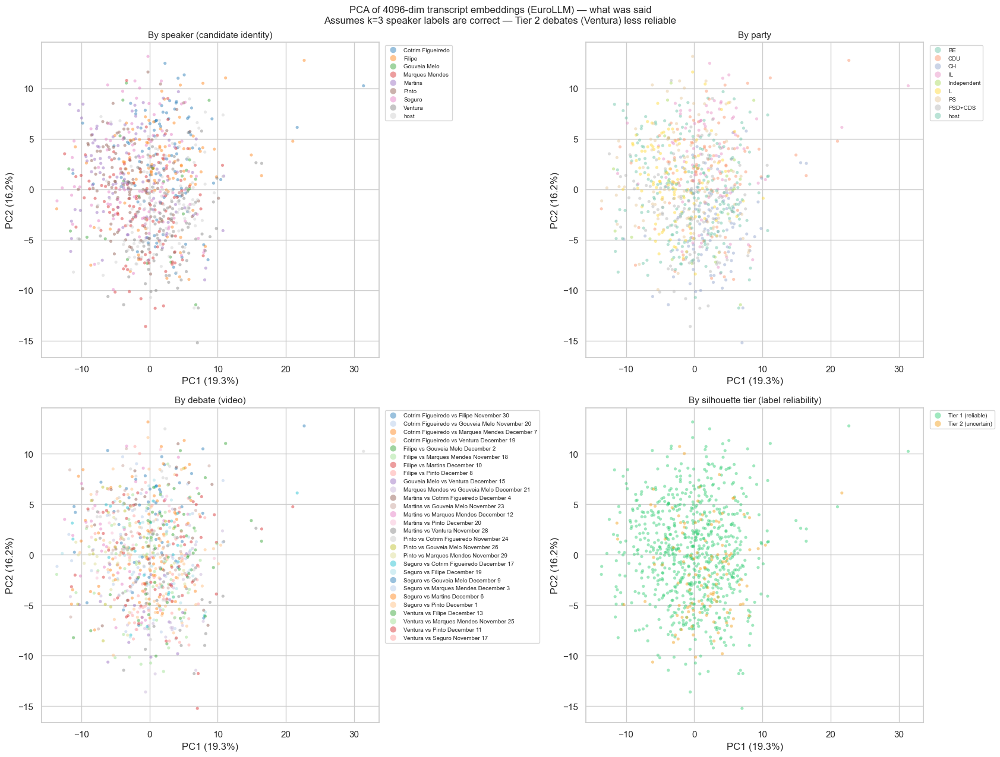

In [41]:
# ── Step 3: visualise — 4 panels ─────────────────────────────────────────────
# Panel 1: colored by speaker (candidate identity)
# Panel 2: colored by party
# Panel 3: colored by debate (video) — to check if topic clusters by debate
#           more than by candidate, which would mean debate topic dominates
# Panel 4: colored by silhouette tier — do unreliable debates pollute the space?

speakers     = speech_labeled['speaker'].values
parties      = speech_labeled['party'].fillna('host').values
videos       = speech_labeled['video'].values
sil_tier     = speech_labeled['video'].map(
    lambda v: ('Tier 1 (reliable)' if quality_scores.get(v, 0) >= 0.45
               else 'Tier 2 (uncertain)')
).values

# Color maps
cand_list    = sorted(set(s for s in speakers if s not in ('host', 'unknown', None)))
cand_palette = sns.color_palette('tab10', len(cand_list))
cand_cmap    = dict(zip(cand_list, cand_palette))
cand_cmap['host']    = '#cccccc'
cand_cmap['unknown'] = '#eeeeee'

party_list   = sorted(set(p for p in parties if pd.notna(p)))
party_palette= sns.color_palette('Set2', len(party_list))
party_cmap   = dict(zip(party_list, party_palette))

video_list   = sorted(set(videos))
vid_palette  = sns.color_palette('tab20', len(video_list))
vid_cmap     = dict(zip(video_list, vid_palette))

tier_cmap    = {'Tier 1 (reliable)': '#2ecc71', 'Tier 2 (uncertain)': '#f39c12'}

fig, axes = plt.subplots(2, 2, figsize=(17, 13))
axes = axes.flatten()

panel_configs = [
    ('By speaker (candidate identity)',  speakers, cand_cmap),
    ('By party',                         parties,  party_cmap),
    ('By debate (video)',                 videos,   vid_cmap),
    ('By silhouette tier (label reliability)', sil_tier, tier_cmap),
]

for ax, (title, labels_arr, cmap) in zip(axes, panel_configs):
    unique_labels = sorted(set(l for l in labels_arr if pd.notna(l)))
    for lbl in unique_labels:
        mask = labels_arr == lbl
        ax.scatter(
            T_2d[mask, 0], T_2d[mask, 1],
            c=[cmap.get(lbl, '#aaaaaa')],
            label=str(lbl).replace('_', ' '),
            alpha=0.45, s=14,
            edgecolors='none', rasterized=True
        )
    ax.set_title(title, fontsize=11)
    ax.set_xlabel(f'PC1 ({var1:.1f}%)')
    ax.set_ylabel(f'PC2 ({var2:.1f}%)')
    ax.legend(fontsize=7, bbox_to_anchor=(1.01, 1), loc='upper left',
              markerscale=2, framealpha=0.8)

plt.suptitle(
    'PCA of 4096-dim transcript embeddings (EuroLLM) — what was said\n'
    'Assumes k=3 speaker labels are correct — Tier 2 debates (Ventura) less reliable',
    fontsize=12
)
plt.tight_layout()
plt.show()

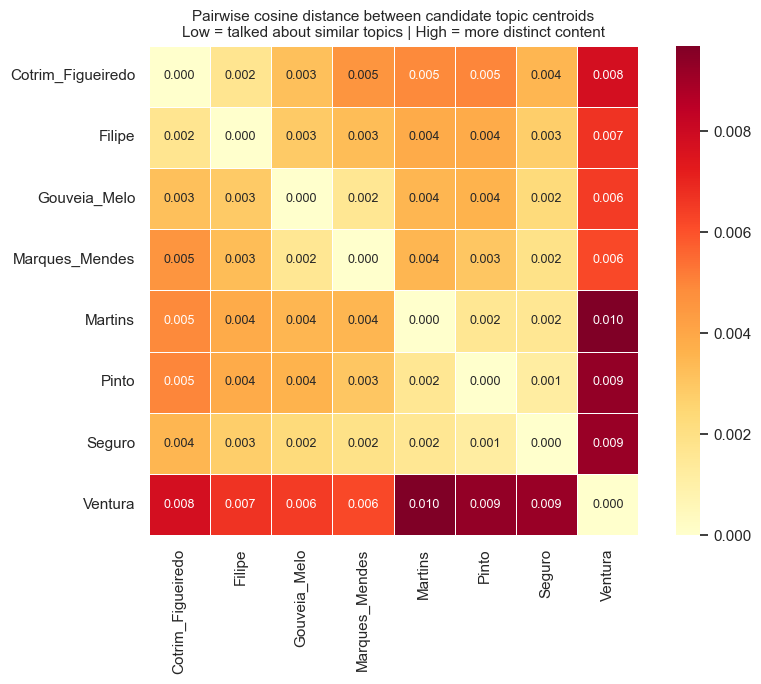

Most topically similar candidate pairs (lowest cosine distance):
  Pinto                     — Seguro                     dist=0.0012
  Gouveia_Melo              — Marques_Mendes             dist=0.0016
  Martins                   — Pinto                      dist=0.0016
  Martins                   — Seguro                     dist=0.0016

Most topically distinct candidate pairs (highest cosine distance):
  Cotrim_Figueiredo         — Ventura                    dist=0.0078
  Seguro                    — Ventura                    dist=0.0092
  Pinto                     — Ventura                    dist=0.0093
  Martins                   — Ventura                    dist=0.0097


In [42]:
# ── Step 4: per-candidate debate similarity — do they keep topics constant? ──
# Instead of one global candidate-vs-candidate matrix, build one mini heatmap per
# candidate. Each cell compares that candidate's mean transcript embedding in two
# different debates. High cosine similarity = similar semantic content / agenda.
#
# We keep cosine similarity (not raw Pearson correlation) because text embeddings
# are normally compared with cosine distance/similarity.

from scipy.spatial.distance import cdist

MIN_SEGMENTS_PER_DEBATE = 5
MONTH_MAP = {'November': 11, 'December': 12}


def parse_debate_date(video_name):
    m = re.search(r'(November|December)_(\d+)$', video_name)
    if not m:
        return (99, 99)
    return (MONTH_MAP.get(m.group(1), 99), int(m.group(2)))


def debate_label_for_candidate(video_name, candidate):
    parts = video_name.split('_vs_')
    if len(parts) != 2:
        return video_name.replace('_', ' ')
    left = parts[0]
    right = parts[1]
    opponent = right if left == candidate else left
    opponent = re.sub(r'_(November|December)_\d+$', '', opponent)
    date_match = re.search(r'(November|December)_(\d+)$', video_name)
    date_str = ''
    if date_match:
        month = 'Nov' if date_match.group(1) == 'November' else 'Dec'
        date_str = f' ({month} {date_match.group(2)})'
    return opponent.replace('_', ' ') + date_str


cand_speech = speech_labeled[
    speech_labeled['speaker'].isin(cand_list)
].copy()

cand_debate_tables = {}
all_offdiag = []
summary_rows = []

for cand in cand_list:
    sub = cand_speech[cand_speech['speaker'] == cand].copy()
    debate_rows = []
    for video, debate_sub in sub.groupby('video'):
        n_segments = len(debate_sub)
        if n_segments < MIN_SEGMENTS_PER_DEBATE:
            continue
        centroid = np.stack(debate_sub[emb_col].values).mean(axis=0)
        debate_rows.append({
            'video': video,
            'label': debate_label_for_candidate(video, cand),
            'sort_key': parse_debate_date(video),
            'n_segments': n_segments,
            'centroid': centroid,
        })

    debate_rows = sorted(debate_rows, key=lambda d: d['sort_key'])
    cand_debate_tables[cand] = debate_rows

    if len(debate_rows) >= 2:
        centroids = np.stack([r['centroid'] for r in debate_rows])
        sim_matrix = 1 - cdist(centroids, centroids, metric='cosine')
        labels = [r['label'] for r in debate_rows]
        sim_df = pd.DataFrame(sim_matrix, index=labels, columns=labels)
        offdiag = sim_matrix[np.triu_indices_from(sim_matrix, k=1)]
        all_offdiag.extend(offdiag.tolist())

        pair_rows = []
        for i in range(len(labels)):
            for j in range(i + 1, len(labels)):
                pair_rows.append({
                    'a': labels[i],
                    'b': labels[j],
                    'similarity': sim_matrix[i, j],
                })
        pair_df = pd.DataFrame(pair_rows).sort_values('similarity')
        least_consistent = f"{pair_df.iloc[0]['a']} vs {pair_df.iloc[0]['b']}"
        min_similarity = pair_df.iloc[0]['similarity']
        mean_similarity = offdiag.mean()
    else:
        sim_df = None
        mean_similarity = np.nan
        min_similarity = np.nan
        least_consistent = 'not enough debates'

    summary_rows.append({
        'candidate': cand,
        'debates_kept': len(debate_rows),
        'total_segments_kept': sum(r['n_segments'] for r in debate_rows),
        'mean_between_debate_similarity': mean_similarity,
        'lowest_pair_similarity': min_similarity,
        'lowest_similarity_pair': least_consistent,
    })

summary_df = pd.DataFrame(summary_rows).sort_values('mean_between_debate_similarity', ascending=False)
display(summary_df.round(3))

if all_offdiag:
    vmin = max(0.0, min(all_offdiag) - 0.03)
else:
    vmin = 0.0

ncols = 4
nrows = math.ceil(len(cand_list) / ncols)
fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4.5 * nrows))
axes = np.atleast_1d(axes).flatten()

for ax, cand in zip(axes, cand_list):
    debate_rows = cand_debate_tables[cand]
    if len(debate_rows) < 2:
        ax.axis('off')
        ax.text(0.5, 0.55, cand.replace('_', ' '), ha='center', va='center', fontsize=11, fontweight='bold')
        ax.text(0.5, 0.42, f'< 2 debates with >= {MIN_SEGMENTS_PER_DEBATE} labeled segments',
                ha='center', va='center', fontsize=9)
        continue

    labels = [r['label'] for r in debate_rows]
    centroids = np.stack([r['centroid'] for r in debate_rows])
    sim_matrix = 1 - cdist(centroids, centroids, metric='cosine')
    sim_df = pd.DataFrame(sim_matrix, index=labels, columns=labels)
    mean_sim = sim_matrix[np.triu_indices_from(sim_matrix, k=1)].mean()

    sns.heatmap(
        sim_df,
        vmin=vmin, vmax=1.0,
        cmap='YlGnBu',
        square=True,
        annot=True, fmt='.2f',
        linewidths=0.4,
        cbar=False,
        ax=ax,
        annot_kws={'size': 8}
    )
    ax.set_title(
        f"{cand.replace('_', ' ')}\nmean similarity={mean_sim:.2f}",
        fontsize=10
    )
    ax.tick_params(axis='x', rotation=55, labelsize=8)
    ax.tick_params(axis='y', rotation=0, labelsize=8)

for ax in axes[len(cand_list):]:
    ax.axis('off')

plt.suptitle(
    'Per-candidate transcript embedding similarity across debates\n'
    'High cosine similarity means the candidate kept semantically similar content across debates',
    fontsize=13,
    y=1.01
)
plt.tight_layout()
plt.show()

print(f'Minimum labeled transcript segments per candidate-debate kept: {MIN_SEGMENTS_PER_DEBATE}')
print('Interpretation: values near 1 mean the candidate said semantically similar things in those two debates;')
print('lower values suggest more topic shift across opponents or dates.')


